# Aplicación del libro Advances in Financial Machine Learning en datos del Step Index

El proyecto se basa en:
* Lo expuesto en el libro de Marco Lopez de Prado: Advances in Financial Machine Learning.
* Las explicaciones que da [Hudson & Thames](https://hudsonthames.org/) que tiene un [canal de Youtube](https://www.youtube.com/@thamesandhudsonvideo) donde de forma especializada y académica tratan el libro de Lopez de Prado entre otros temas relacionados a ML en Finanzas.
* Lopez de Prado propone algunas funciones para Python, las desarrollamos con la ayuda de Trade Mamba en su [canal de Youtube](https://www.youtube.com/@MLAlgoTrader) que, pese a no ser tan especializado, permite ayudar en la implementación.
* Hudson & Thames implementaron un paquete para python llamado [MLFinlab](https://www.mlfinlab.com/en/latest/getting_started/installation.html) que implementa una gran cantidad de módulos propuestos por Lopez de Prado, sin embargo es de pago pero su documentación ayuda a entender algunos conceptos.

In [ ]:
# @title Importación de librerías para el proyecto

from typing import Callable


# Carga y manejo del conjunto de datos
import pandas as pd
import numpy as np

# ml finlab
import mlfinlab as mlf
# ML Finlab data analysis
from mlfinlab import data_structures
from mlfinlab.filters import filters
from mlfinlab.labeling import labeling

# Ml Finlab sampling
from mlfinlab.sampling import bootstrapping
from mlfinlab.sampling import concurrent
from mlfinlab.util import multiprocess

# ML Finlab features
from mlfinlab.sample_weights import attribution
from mlfinlab.features import fracdiff

# ML Finlab Cross Validation
from mlfinlab.cross_validation import cross_validation
# ML Finlab Ensemble Methods
from mlfinlab.ensemble import SequentiallyBootstrappedBaggingClassifier


# MLFinlab Feature Importance
from mlfinlab.feature_importance.importance import (mean_decrease_impurity,
                                        mean_decrease_accuracy,
                                        single_feature_importance, plot_feature_importance)

# Graficación y análisis de datos
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import seaborn as sns
from plotly.offline import iplot

from scipy import stats


# Análisis de correlaciones
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

# Normalización y escalado de datos
from sklearn.preprocessing import MinMaxScaler, StandardScaler

# Estacionariedad
from statsmodels.tsa.stattools import adfuller

# Data split
from sklearn.utils import resample
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split

# Ranfom forest
from sklearn.ensemble import RandomForestClassifier, BaggingClassifier
from sklearn.tree import DecisionTreeClassifier

from sklearn.metrics import roc_curve
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.metrics import log_loss

from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV


In [ ]:
# @title Cargar todo lo necesario hasta el momento
# @title Cargar tick  bars
tick_bars = pd.read_csv('Documents/Trading/Datasets/stepindex_tick_bars.csv', index_col='date_time')
tick_bars

tick_bars.index = pd.to_datetime(tick_bars.index, format='mixed')
tick_bars.drop(columns=['tick_num', 'volume', 'cum_buy_volume', 'cum_ticks', 'cum_dollar_value'], inplace=True)
tick_bars.columns = ['Open', 'High', 'Low', 'Close']
tick_bars.index.name = 'Datetime'
tick_bars

#Cargar etiquetas y triple barrier method
labels = pd.read_csv('Documents/Trading/Datasets/stepindex_binary_labels.csv', index_col=0)

labels.index = pd.to_datetime(labels.index)
print(labels.head())

triple_barrier_events = pd.read_csv('Documents/Trading/Datasets/stepindex_triple_barrier_events.csv', index_col=0)
triple_barrier_events.index = pd.to_datetime(triple_barrier_events.index)
triple_barrier_events.t1 = pd.to_datetime(triple_barrier_events.t1)

# @title limpiar y actualizar triple barrier events
triple_barrier_events.dropna(inplace=True)
triple_barrier_events = triple_barrier_events.loc[labels.index]
triple_barrier_events
print(triple_barrier_events.head())

print(labels.shape)
print(triple_barrier_events.shape)

boot_barrier_events = pd.read_csv('Documents/Trading/Datasets/stepindex_boot_barrier_events.csv', index_col=0)
boot_barrier_events.index = pd.to_datetime(boot_barrier_events.index)
boot_barrier_events.t1 = pd.to_datetime(boot_barrier_events.t1)
boot_barrier_events

                          ret      trgt  bin
2019-05-30 17:18:22  0.003581  0.002240  1.0
2019-05-31 09:48:22  0.002830  0.002058  1.0
2019-06-01 05:03:22 -0.001910  0.003078 -1.0
2019-06-02 08:33:22 -0.000918  0.002760 -1.0
2019-06-05 05:18:22 -0.000917  0.002407 -1.0
                                     t1      trgt  pt  sl
2019-05-30 17:18:22 2019-05-31 09:48:22  0.002240   1   1
2019-05-31 09:48:22 2019-06-01 10:33:22  0.002058   1   1
2019-06-01 05:03:22 2019-06-02 05:48:22  0.003078   1   1
2019-06-02 08:33:22 2019-06-03 09:18:22  0.002760   1   1
2019-06-05 05:18:22 2019-06-06 06:03:22  0.002407   1   1
(2388, 3)
(2388, 4)


,t1,trgt,pt,sl
index,,,,
2019-05-31 09:48:22.000,2019-06-01 10:33:22.000,0.002058,1,1
2019-06-01 05:03:22.000,2019-06-02 05:48:22.000,0.003078,1,1
2019-06-05 05:18:22.000,2019-06-06 06:03:22.000,0.002407,1,1
2019-06-06 14:18:22.000,2019-06-07 12:18:22.000,0.002262,1,1
2019-06-08 04:48:22.000,2019-06-08 13:03:22.000,0.002409,1,1
...,...,...,...,...
2024-11-28 21:27:09.171,2024-11-29 08:27:09.191,0.003327,1,1
2024-12-04 23:11:51.205,2024-12-05 10:11:51.181,0.003559,1,1
2024-12-05 23:56:51.192,2024-12-07 00:41:51.114,0.003167,1,1


## Introducción

### Descripción del dataset

El dataset utilizado en este proyecto proviene de la plataforma MetaTrader de [Deriv](https://app.deriv.com/?lang=ES), una plataforma de trading ampliamente utilizada para operar con instrumentos financieros e **índices sintéticos**. Los datos corresponden al instrumento denominado Step Index, un índice sintético diseñado para simular movimientos de precios de manera controlada y predecible.

**Origen y Estructura del Dataset**  
El dataset contiene más de 174 millones de filas y tres columnas principales:

* *Datetime*: Marca temporal de cada tick, representada con precisión en milisegundos, que indica el momento exacto en que el precio se registró.
* *Bid*: Precio de compra (Bid) en un momento específico.
* *Ask*: Precio de venta (Ask) en el mismo instante.  
Cada fila del dataset corresponde a un único tick, que es el cambio más pequeño en el precio. Los datos están organizados cronológicamente, con una frecuencia de generación aproximada de un tick por segundo.

**¿Qué son los índices sintéticos de Deriv?**  
Los índices sintéticos, como el Step Index, son instrumentos financieros creados de **manera artificial** por Deriv. Estos índices no dependen de mercados reales ni eventos económicos, sino que están diseñados para ofrecer un entorno de trading controlado. Los índices sintéticos son populares porque:

1. Operan las 24/7: Están disponibles en todo momento, sin depender de horarios de mercado.  
2. No están influenciados por noticias económicas: Su comportamiento no se ve afectado por eventos externos.
3. Ofrecen características predecibles: Están diseñados con reglas matemáticas claras.

**Características del Step Index**  
El Step Index es un índice sintético que sigue un comportamiento completamente aleatorio, pero con reglas bien definidas:

1. Generación de ticks: Se genera un tick aproximadamente cada segundo, asegurando una frecuencia constante en la actualización del precio.
2. Tamaño de los movimientos: Cada movimiento del índice es fijo, con un incremento o decremento de 0.1 unidades por tick.  
3. Probabilidad equilibrada: Según la descripción oficial de Deriv, el Step Index tiene una probabilidad igual del 50% de moverse hacia arriba o hacia abajo en cada tick, lo que simula un camino aleatorio o random walk controlado.

Esta dinámica lo hace ideal para estudios de volatilidad y predicción, ya que los movimientos del índice no están influenciados por factores externos, como noticias o eventos macroeconómicos. En cambio, sus movimientos son generados por algoritmos que aseguran un comportamiento aleatorio, pero predecible en términos de probabilidad y magnitud de los pasos. Aún así se discute la fiabilidad de estas características ya que algunos traders afirman que el mercado es **manipulado por la empresa Deriv**.


### Problema a resolver



### Metodología

Para la aplicación de modelos de Machine Learning se seguirá la metodología propuesta por Lopez de Prado en su libro Advances in Financial Machine Learning donde abarca en profundidad los procesos de Preprocesado de los datos, Muestreo, Etiquetado, Modelado y Baktesting, específicamente seguiremos la siguiente estructura:

**Data Structure:**

Exploraremos la generación de Tick Imbalance Bars con el fin de obtener datos signficativos para los modelos de ML.

**Sampling Data:**

Además, se realizará un muestreo basado en eventos que mejora aún más lo realizado en el primer paso.

**Labelling:**

Etiquetaremos las observaciones utilizando principalmente el método de la triple barrera.

MAS PROCESOS.....



## Carga de datos y preprocesado básico


In [ ]:
# google colab conectado a entorno local
A1 = pd.read_csv("Documents\Trading\Datasets\Step_Index_ticks_201905280733_202412082052.csv")
# A1 = pd.read_csv("Documents\Trading\Datasets\Step_Index_ticks_202407011400_202412041352.csv")

# jupyter lab
# A1 = pd.read_csv("Datasets\Step_Index_ticks_201905280733_202412082052.csv")

A1

NameError: name 'pd' is not defined

In [ ]:
# @title Preprocesado de Deriv
A1.drop(columns=['<LAST>', '<VOLUME>', '<FLAGS>'], inplace=True)
A1['Datetime'] = A1['<DATE>'] + ' ' + A1['<TIME>']
A1.drop(columns=['<DATE>', '<TIME>'], inplace=True)
A1['Datetime'] = pd.to_datetime(A1['Datetime'], format='mixed')
A1.set_index('Datetime', inplace=True)
A1.columns = ['Bid', 'Ask']

A1.to_csv('Documents/Trading/Datasets/Step_Index_ticks_202407011400_202412041352.csv')
A1

C:\Users\angel\AppData\Local\Programs\Python\Python311\Lib\site-packages\pandas\core\indexes\base.py:7834: RuntimeWarning:

invalid value encountered in cast



,Bid,Ask
Datetime,,
2024-07-01 14:00:00.402,8002.5,8002.6
2024-07-01 14:00:01.227,8002.6,8002.7
2024-07-01 14:00:02.267,8002.5,8002.6
2024-07-01 14:00:03.191,8002.4,8002.5
2024-07-01 14:00:04.236,8002.5,8002.6
...,...,...
2024-12-04 13:51:58.191,8199.7,8199.8
2024-12-04 13:51:59.193,8199.8,8199.9
2024-12-04 13:52:00.195,8199.7,8199.8


Le damos formato datetime a la columna Datetime y la establecemos como el índice de nuestro dataset para un mejor manejo en la exploración de los datos.

In [ ]:
A1.head(10)

,Datetime,Bid,Ask
0,2019-05-28 07:33:23,10040.1,10040.3
1,2019-05-28 07:33:24,10040.2,10040.4
2,2019-05-28 07:33:25,10040.3,10040.5
3,2019-05-28 07:33:26,10040.4,10040.6
4,2019-05-28 07:33:27,10040.3,10040.5
5,2019-05-28 07:33:28,10040.2,10040.4
6,2019-05-28 07:33:29,10040.3,10040.5
7,2019-05-28 07:33:30,10040.4,10040.6
8,2019-05-28 07:33:31,10040.5,10040.7
9,2019-05-28 07:33:32,10040.6,10040.8


In [ ]:
A1.describe()

,Bid,Ask
count,1.745674e+08,1.745674e+08
mean,9.097552e+03,9.097655e+03
std,7.068262e+02,7.068299e+02
min,7.950400e+03,7.950500e+03
25%,8.543500e+03,8.543600e+03
50%,8.891900e+03,8.892000e+03
75%,9.793300e+03,9.793400e+03
max,1.046010e+04,1.046020e+04


In [ ]:
A1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 174567363 entries, 0 to 174567362
Data columns (total 3 columns):
 #   Column    Dtype  
---  ------    -----  
 0   Datetime  object 
 1   Bid       float64
 2   Ask       float64
dtypes: float64(2), object(1)
memory usage: 3.9+ GB


In [ ]:
A1.tail(10)

,Datetime,Bid,Ask
174567353,2024-12-08 20:52:38.134,8144.3,8144.4
174567354,2024-12-08 20:52:39.117,8144.2,8144.3
174567355,2024-12-08 20:52:40.129,8144.3,8144.4
174567356,2024-12-08 20:52:41.122,8144.2,8144.3
174567357,2024-12-08 20:52:42.135,8144.1,8144.2
174567358,2024-12-08 20:52:43.135,8144.2,8144.3
174567359,2024-12-08 20:52:44.129,8144.1,8144.2
174567360,2024-12-08 20:52:45.133,8144.0,8144.1
174567361,2024-12-08 20:52:46.126,8144.1,8144.2
174567362,2024-12-08 20:52:47.116,8144.0,8144.1


### Identificación y manejo de valores nulos

La siguiente función identifica el número de valores nulos presentes en las columnas (si los hay)

In [ ]:
A1.isnull().sum()

Datetime    0
Bid         0
Ask         0
dtype: int64

Podemos notar que no existen valores nulos.

## Data structure

### Tick Imbalance Bars

In [ ]:
A1.set_index('Datetime', inplace=True)
A1.index = pd.to_datetime(A1.index, format='mixed')
A1

,Bid,Ask
Datetime,,
2019-05-28 07:33:23.000,10040.1,10040.3
2019-05-28 07:33:24.000,10040.2,10040.4
2019-05-28 07:33:25.000,10040.3,10040.5
2019-05-28 07:33:26.000,10040.4,10040.6
2019-05-28 07:33:27.000,10040.3,10040.5
...,...,...
2024-12-08 20:52:43.135,8144.2,8144.3
2024-12-08 20:52:44.129,8144.1,8144.2
2024-12-08 20:52:45.133,8144.0,8144.1


**Referencias:**
* Capítulo 2: Financial Data Structures del  libro Advances in Financial Machine Learning en la sección de Imbalance Bars.
* [Video](https://www.youtube.com/watch?v=BumY00BJ61g&list=PLfv9eTYgatm0n1TuVZSkWs0OoCsYlRIto&index=2) de Hudson & Thames de explicación de la estructuras propuestas por Lopez de Prado.
* [Documentación de MLFinlab](https://www.mlfinlab.com/en/latest/data_structures/imbalance.html) relacionada a Imbalance Bars

Existen muchas maneras de generar barras que sean representativas para modelos de ML, Lopez de Prado (2018) propone algunas soluciones; time bars, volume bars, dollar bars, imbalances bars entre otras. En este poryecto exploraremos el uso de Tick Imbalance Bars que buscan crear barras cada vez que se presente un cambio importante en el precio del activo, lo que nos puede dar un indicio de que hay mayor interés por parte de los participantes del mercado en negociar el activo en cuestión.  
Las **Tick Imbalance Bars** se generan acumulando ticks hasta que el tick imbalance acumulado alcanza un umbral objetivo predeterminado ($E[T]$ o "Expected Tick Imbalance"). Una barra se forma cuando se cumple esta condición.  
1. Tick Imbalance
El tick imbalance ($bt$) es un indicadorque depende del cambio del precio, si el precio de un tick a otro sube, entonces $bt = 1$, si el precio baja entnces $bt = -1$ y si el precio no cambia entonces $bt = 0$. Sin embargo, la naturaleza de nuestros datos tiene una pequeña diferencia a activos convencionales y es que cada tick siempre representa un cambio en el precio, y además este cambio es **siempre** del mismo tamaño: el cambio es de 0.1 ya sea hacia abajo o hacia arriba. Por lo tanto el valor de $bt$ nunca será 0. Datos de otros activos podrían tener una secuencia de ticks donde el valor del precio no cambia, o que haya una diferencia del precio distinta en cada nuevo tick.

2. Acumulación del desequilibrio ($cumsum(bt)$)
A medida que se acumulan los ticks, se suma bt, cuando esta suma acumulada alcanza el umbral objetivo (positivo o negativo), se genera una barra.

3. Umbral de Tick Imbalance ($E[T]$)
Este umbral es un parámetro clave que controla el tamaño de las barras. Una elección inadecuada de este valor puede generar barras demasiado grandes (que engloban una gran cantidad de ticks) o al revés.

Para ver un poco más de la teoría matemática detrás de la generación de estas barras puede chequear la sección 2.3.2 Information-Driven Bars del capítulo 2 del libro Advances in Financial Machine Learning que profundiza el tema.


El código a continuación carga las tick imbalance que serán calculadas más adelante, nada más que fueron guardadas en un csv para tener acceso rápido a estas.

In [ ]:
# @title Cargar tick imbalance bars
imbalance_bars = pd.read_csv('Documents/Trading/Datasets/stepindex_imbalance_bars.csv', index_col='Date')
# imbalance_bars = pd.read_csv('stepindex_imbalance_bars.csv', index_col='Date')

imbalance_bars.index = pd.to_datetime(imbalance_bars.index)
imbalance_bars.StartDateTime = pd.to_datetime(imbalance_bars.StartDateTime)
imbalance_bars.EndDateTime = pd.to_datetime(imbalance_bars.EndDateTime)
imbalance_bars

,StartDateTime,EndDateTime,Open,High,Low,Close,NumTicks
Date,,,,,,,
2019-05-28 07:33:23.000,2019-05-28 07:33:23.000,2019-05-28 11:59:39.000,10040.1,10048.0,10030.1,10030.1,15977
2019-05-28 11:59:40.000,2019-05-28 11:59:40.000,2019-05-28 13:53:11.000,10030.0,10033.5,10020.1,10020.1,6812
2019-05-28 13:53:12.000,2019-05-28 13:53:12.000,2019-05-28 15:01:41.000,10020.0,10030.1,10015.1,10030.1,4110
2019-05-28 15:01:42.000,2019-05-28 15:01:42.000,2019-05-28 23:09:07.000,10030.0,10040.1,10021.6,10040.1,29246
2019-05-28 23:09:08.000,2019-05-28 23:09:08.000,2019-05-29 01:01:49.000,10040.2,10050.1,10037.9,10050.1,6762
...,...,...,...,...,...,...,...
2024-12-08 06:04:40.130,2024-12-08 06:04:40.130,2024-12-08 08:01:43.132,8193.7,8201.6,8183.6,8183.6,7024
2024-12-08 08:01:44.136,2024-12-08 08:01:44.136,2024-12-08 10:37:49.116,8183.7,8189.9,8173.6,8173.6,9366
2024-12-08 10:37:50.122,2024-12-08 10:37:50.122,2024-12-08 12:22:33.125,8173.5,8180.1,8163.6,8163.6,6284


Primero se define una función que calcule la *tick rule*, la cuál define una secuencia $\{b_t\}_t = 1,...,T$ donde

$$
b_t =
\begin{cases}
b_{t-1} & \text{if } \Delta p_t = 0 \\
|\Delta p_t|/\Delta p_t & \text{if } \Delta p_t \neq 0
\end{cases}
$$

con $b_t \in \{-1, 1\}$. Y la condición límite $b_0$ se establece para que sea igual que el último valor $b_T$ de la barra que le precede.

In [ ]:
# @title Función para calcular la regla de ticks (tick rule)
def get_tick_rule(current_price, previous_price):
    """
    Calcula la tick rule según el cambio de precio.
    """
    if current_price > previous_price:
        return 1
    elif current_price < previous_price:
        return -1
    else:
        return 0

Después definimos una función para calcula el promedio móvil exponencial que nos ayudará a estimar el valor esperado del Tick Imbalance al inicio de empezar a crear una barra. Por lo que si el tick imbalance real excede dicho valor, se crea la barra.

In [ ]:
# @title Función para calcular el promedio móvil exponencial (EWMA)
def ewma(data, window):
    """
    Calcula el promedio móvil exponencial (EWMA).
    """
    return pd.Series(data).ewm(span=window, adjust=False).mean().iloc[-1]

Por último definimos el código que iterará por cada tick de nuestro dataset, calculado la tick rule para cada tick, el acumulado del Tick Imbalance y el valor esperado de dicho valor. Si este valor es superado entonces se crea una barra que se almacena en un nuevo dataframe llamado `imbalance_bars_df`.  
Para efectos de debugging, irá imprimiendo la fecha de la barra creada y el número de ticks que se necesitaron para crear dicha barra.

**NOTA IMPORTANTE:** Por la naturaleza de los datos del Step Index en donde cada movimiento de tick es del mismo tamaño (0.1) y que existe la misma probabildad de que el movimiento sea positivo y negativo. No es posible utilizar un threshold que nos indique un imablanace en los ticks ya que realmente los movimientos normalmente son del mismo tamaño. Por lo que esta forma de crear las barras termina convergiendo a crear barras de 1 tick de tamaño. Lo cual no es nuestro objetivo.

Debido a esto, decidimos definir un threshold fijo de 100 pts, es decir, si el precio se mueve 100 pts (no necesariamente consecutivos) en una dirección, entonces se crea una barra.

In [ ]:
# @title Creacion Tick Imbalance Bars
# Inicialización de parámetros y acumuladores
# num_prev_bars = 10  # Número de barras previas para calcular el promedio
# expected_num_ticks_init = 1000  # Ticks iniciales esperados
expected_num_ticks = expected_num_ticks_init
cum_theta = 0  # Desequilibrio acumulado
num_ticks = 0  # Contador de ticks
# imbalance_array = []  # Desequilibrios de ticks acumulados
imbalance_bars = []  # Lista para almacenar las barras
# bar_length_array = []  # Longitudes de barras anteriores (en ticks)
expected_imbalance = 100  # Valor inicial predeterminado para evitar NameError

# Extraer el precio promedio de cada tick
# A1['Price'] = (A1['Bid'] + A1['Ask']) / 2

# Iteración sobre los datos
for i, (index, row) in enumerate(A1.iterrows()):
    # if i > 1500:  # Limitar a 100,000 iteraciones para pruebas
        # break
    # Obtener el precio actual y el precio anterior
    current_price = row['Bid']
    previous_price = A1['Bid'].iloc[i - 1] if i > 0 else current_price

    # Calcular el tick rule
    tick_rule = get_tick_rule(current_price, previous_price)
    # imbalance_array.append(tick_rule)

    # Actualizar el desequilibrio acumulado y el número de ticks
    cum_theta += tick_rule
    num_ticks += 1

    # # Calcular el desequilibrio esperado inicial (para las primeras barras)
    # if len(imbalance_bars) == 0 and len(imbalance_array) >= expected_num_ticks_init:
    #     expected_imbalance = ewma(imbalance_array, window=expected_num_ticks_init)

    # Verificar la condición para formar una barra
    # if abs(cum_theta) >= expected_num_ticks * abs(expected_imbalance):
    if abs(cum_theta) >= expected_imbalance:
        # Formar una barra
        start_time = A1.index[i - num_ticks + 1]  # Índice de inicio
        end_time = index  # Índice actual
        bar = {
            'StartDateTime': start_time,
            'EndDateTime': end_time,
            'Open': A1['Bid'].iloc[i - num_ticks + 1],
            'High': A1['Bid'].iloc[i - num_ticks + 1:i + 1].max(),
            'Low': A1['Bid'].iloc[i - num_ticks + 1:i + 1].min(),
            'Close': current_price,
            'NumTicks': num_ticks
        }

        imbalance_bars.append(bar)

        # Actualizar estadísticas
        # bar_length_array.append(num_ticks)

        print(f"start_time {start_time}, num ticks {num_ticks}")
        # Reiniciar acumuladores
        cum_theta, num_ticks = 0, 0

        # Actualizar valores esperados
        # expected_num_ticks = ewma(bar_length_array, window=num_prev_bars)
        # expected_imbalance = ewma(imbalance_array, window=num_prev_bars * expected_num_ticks)


# Convertir las barras en un DataFrame
imbalance_bars = pd.DataFrame(imbalance_bars)

# Mostrar las primeras filas del resultado
imbalance_bars

start_time 2019-05-28 07:33:23, num ticks 1000
start_time 2019-05-28 10:20:03, num ticks 32
start_time 2019-05-28 10:25:23, num ticks 36
start_time 2019-05-28 10:31:23, num ticks 99
start_time 2019-05-28 10:47:53, num ticks 9
start_time 2019-05-28 10:49:23, num ticks 11
start_time 2019-05-28 10:51:13, num ticks 52
start_time 2019-05-28 10:59:53, num ticks 9
start_time 2019-05-28 11:01:23, num ticks 9
start_time 2019-05-28 11:02:53, num ticks 6
start_time 2019-05-28 11:03:53, num ticks 3
start_time 2019-05-28 11:04:23, num ticks 5
start_time 2019-05-28 11:05:13, num ticks 2
start_time 2019-05-28 11:05:33, num ticks 1
start_time 2019-05-28 11:05:43, num ticks 1
start_time 2019-05-28 11:05:53, num ticks 2
start_time 2019-05-28 11:06:13, num ticks 1
start_time 2019-05-28 11:06:23, num ticks 4
start_time 2019-05-28 11:07:03, num ticks 1
start_time 2019-05-28 11:07:13, num ticks 1
start_time 2019-05-28 11:07:23, num ticks 1
start_time 2019-05-28 11:07:33, num ticks 1
start_time 2019-05-28 11

KeyboardInterrupt: 

In [ ]:
# @title Guardar barras
imbalance_bars.to_csv('Documents/Trading/Datasets/stepindex_imbalance_bars.csv')

**Plot Tick Imbalance Bars**

In [ ]:
fig = go.Figure(data=[go.Candlestick(x=imbalance_bars['StartDateTime'],
                open=imbalance_bars['Open'],
                high=imbalance_bars['High'],
                low=imbalance_bars['Low'],
                close=imbalance_bars['Close'])])

# iplot(fig)
fig.show()

#### MLFinlab

Decidimos realizar la prueba de crear las barras con el paquete MLFinlab para ver si también generaba el mismo problema de que eventualmente se crearían barras de 1 tick y efectivamente este fue el caso por lo que queda descartado el uso de Tick Imbalance Bars para datos del Step Index.

In [ ]:
file_path=r"C:\Users\angel\Documents\Trading\Datasets\Step_Index_ticks_202407011400_202412041352.csv"
output_path=r"C:\Users\angel\Documents\Trading\Datasets\stepindex_imbalance_bars1.csv"
num_prev_bars = 1000
exp_num_ticks_init = 100000
batch_size = 2e6
imbalance_bars_df = data_structures.get_tick_imbalance_bars(file_path, num_prev_bars=num_prev_bars, exp_num_ticks_init=exp_num_ticks_init,
                            batch_size=2e7, verbose=True, to_csv=False, output_path=output_path)

Reading data in batches:
Batch number: 0
Returning bars 



In [ ]:
imbalance_bars_df

,date_time,open,high,low,close,volume
0,2024-07-02 17:46:39.189,8002.5,8012.3,7968.2,7978.8,7.984499e+08
1,2024-07-02 19:53:05.168,7978.8,7981.1,7963.8,7963.8,6.048511e+07
2,2024-07-04 01:09:04.179,7963.8,7987.3,7950.4,7987.3,8.394308e+08
3,2024-07-04 03:59:12.179,7987.3,7996.1,7979.1,7996.1,8.153907e+07
4,2024-07-04 05:12:25.148,7996.1,7997.3,7985.2,7985.2,3.511245e+07
...,...,...,...,...,...,...
13254525,2024-12-04 13:51:58.191,8199.6,8199.7,8199.6,8199.7,8.199800e+03
13254526,2024-12-04 13:51:59.193,8199.7,8199.8,8199.7,8199.8,8.199900e+03
13254527,2024-12-04 13:52:00.195,8199.8,8199.8,8199.7,8199.7,8.199800e+03
13254528,2024-12-04 13:52:01.195,8199.7,8199.7,8199.6,8199.6,8.199700e+03


In [ ]:
imbalance_bars['Date'] = pd.to_datetime(imbalance_bars.StartDateTime, format='%Y-%m-%d %H:%M:%S.%f')
imbalance_bars.set_index('Date', inplace=True)
imbalance_bars

,StartDateTime,EndDateTime,Open,High,Low,Close,NumTicks
Date,,,,,,,
2019-05-28 07:33:23.000,2019-05-28 07:33:23.000,2019-05-28 11:59:39.000,10040.1,10048.0,10030.1,10030.1,15977
2019-05-28 11:59:40.000,2019-05-28 11:59:40.000,2019-05-28 13:53:11.000,10030.0,10033.5,10020.1,10020.1,6812
2019-05-28 13:53:12.000,2019-05-28 13:53:12.000,2019-05-28 15:01:41.000,10020.0,10030.1,10015.1,10030.1,4110
2019-05-28 15:01:42.000,2019-05-28 15:01:42.000,2019-05-28 23:09:07.000,10030.0,10040.1,10021.6,10040.1,29246
2019-05-28 23:09:08.000,2019-05-28 23:09:08.000,2019-05-29 01:01:49.000,10040.2,10050.1,10037.9,10050.1,6762
...,...,...,...,...,...,...,...
2024-12-08 06:04:40.130,2024-12-08 06:04:40.130,2024-12-08 08:01:43.132,8193.7,8201.6,8183.6,8183.6,7024
2024-12-08 08:01:44.136,2024-12-08 08:01:44.136,2024-12-08 10:37:49.116,8183.7,8189.9,8173.6,8173.6,9366
2024-12-08 10:37:50.122,2024-12-08 10:37:50.122,2024-12-08 12:22:33.125,8173.5,8180.1,8163.6,8163.6,6284


### Tick Bars

In [ ]:
# @title Cargar tick  bars
tick_bars = pd.read_csv('Documents/Trading/Datasets/stepindex_tick_bars.csv', index_col='date_time')
tick_bars

,tick_num,open,high,low,close,volume,cum_buy_volume,cum_ticks,cum_dollar_value
date_time,,,,,,,,,
2019-05-28 10:18:22,9900,10040.1,10048.0,10033.1,10044.8,99399971.2,49931215.2,9900,9.979958e+11
2019-05-28 13:03:22,19800,10044.7,10046.8,10026.4,10031.2,99348404.8,48991852.3,9900,9.969608e+11
2019-05-28 15:48:22,29700,10031.1,10035.4,10015.1,10034.6,99270031.0,49805825.7,9900,9.953883e+11
2019-05-28 18:33:22,39600,10034.7,10035.5,10021.8,10029.8,99275737.0,49397338.4,9900,9.955027e+11
2019-05-28 21:18:22,49500,10029.7,10034.0,10021.6,10034.0,99266101.4,49843972.3,9900,9.953094e+11
...,...,...,...,...,...,...,...,...,...
2024-12-08 09:41:44.130,174527100,8196.2,8197.7,8180.8,8186.7,81053822.0,40142158.0,9900,6.636004e+11
2024-12-08 12:26:44.131,174537000,8186.6,8189.9,8159.9,8159.9,80948303.8,39379163.8,9900,6.618739e+11
2024-12-08 15:11:44.129,174546900,8159.8,8167.5,8144.9,8145.3,80773334.4,39791767.6,9900,6.590155e+11


In [ ]:
# @title Creación de Tick bars con ML Finlab
file_path=r"C:\Users\angel\Documents\Trading\Datasets\Step_Index_ticks_201905280733_202412082052.csv"
output_path=r"C:\Users\angel\Documents\Trading\Datasets\stepindex_tick_bars.csv"
exp_num_ticks_init = 10000
batch_size = 2000000
# tick_bars = data_structures.get_tick_bars(file_path=file_path,
#                                           threshold=9900,
#                                           batch_size=batch_size,
#                                           verbose=True,
#                                           output_path=output_path)
tick_bars = data_structures.get_tick_bars(file_path_or_df=file_path,
                                          threshold=9900,
                                          batch_size=batch_size,
                                          verbose=True,
                                          to_csv=True,
                                          output_path=output_path)

tick_bars.set_index('date_time', inplace=True)

In [ ]:
tick_bars.index = pd.to_datetime(tick_bars.index, format='mixed')
tick_bars.drop(columns=['tick_num', 'volume', 'cum_buy_volume', 'cum_ticks', 'cum_dollar_value'], inplace=True)
tick_bars.columns = ['Open', 'High', 'Low', 'Close']
tick_bars.index.name = 'Datetime'
tick_bars

,Open,High,Low,Close
Datetime,,,,
2019-05-28 10:18:22.000,10040.1,10048.0,10033.1,10044.8
2019-05-28 13:03:22.000,10044.7,10046.8,10026.4,10031.2
2019-05-28 15:48:22.000,10031.1,10035.4,10015.1,10034.6
2019-05-28 18:33:22.000,10034.7,10035.5,10021.8,10029.8
2019-05-28 21:18:22.000,10029.7,10034.0,10021.6,10034.0
...,...,...,...,...
2024-12-08 09:41:44.130,8196.2,8197.7,8180.8,8186.7
2024-12-08 12:26:44.131,8186.6,8189.9,8159.9,8159.9
2024-12-08 15:11:44.129,8159.8,8167.5,8144.9,8145.3


### Comparativa de barras

#### Medir la estabilidad

In [ ]:
# Downsample to weekly periods
imbalance_count = imbalance_bars['Close'].resample('W', label='right').count()
tick_count = tick_bars['Close'].resample('W', label='right').count()

count_df = pd.concat([imbalance_count, tick_count], axis=1)
count_df.columns = ['imbalance', 'tick']
count_df

,imbalance,tick
2019-06-02,53,49
2019-06-09,56,61
2019-06-16,59,61
2019-06-23,48,61
2019-06-30,49,61
...,...,...
2024-11-10,69,62
2024-11-17,72,60
2024-11-24,54,62
2024-12-01,53,61


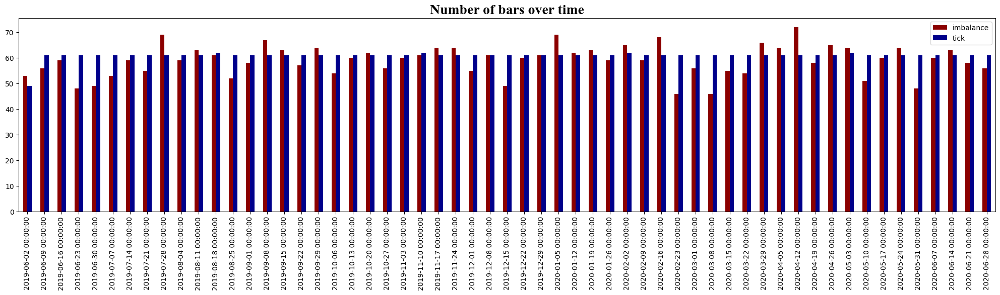

In [ ]:
# @title Plot Number of Bars Over Time
count_df.loc[:'2020-06-30', ['imbalance', 'tick']].plot(kind='bar', figsize=[25, 5], color=('darkred', 'darkblue'))
plt.title('Number of bars over time', loc='center', fontsize=20, fontweight="bold", fontname="Times New Roman")
plt.show()

#### Partial Return to Normality

In [ ]:
# Calculate log returns
imbalance_returns = np.log(imbalance_bars['Close']).diff().dropna()
tick_returns = np.log(tick_bars['Close']).diff().dropna()


<Axes: >

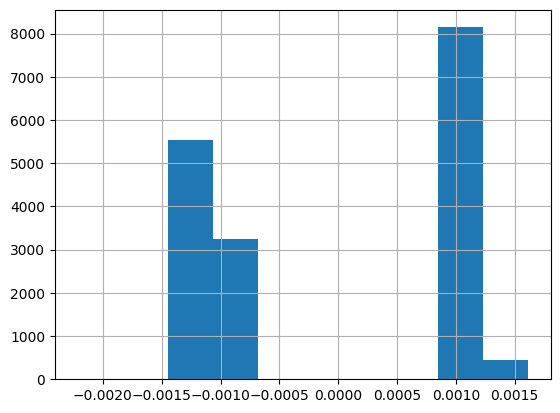

In [ ]:
imbalance_returns.hist()

<Axes: >

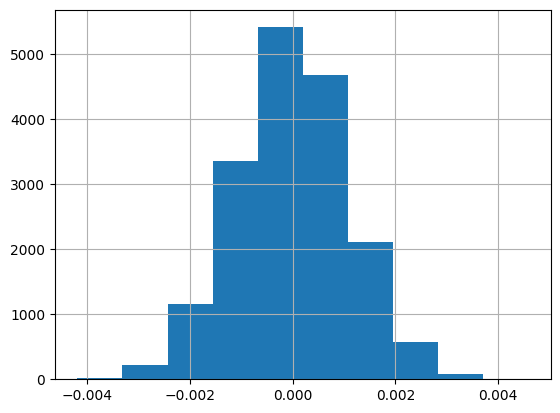

In [ ]:
tick_returns.hist()

#### Medidas de asimetría y curtosis
Asimetría y curtosis	Una tarea fundamental en muchos análisis estadísticos es caracterizar la ubicación y la variabilidad de un conjunto de datos. Otra caracterización de los datos incluye la asimetría y la curtosis.

#### Asimetria (skew)
La asimetría es una medida de simetría o, más precisamente, de falta de simetría. Una distribución o un conjunto de datos es simétrico si parece igual a la izquierda y a la derecha del punto central.

La asimetría de una distribución normal es cero, y cualquier dato simétrico debe tener una asimetría cercana a cero. Los valores negativos de la asimetría indican datos que están sesgados hacia la izquierda y los valores positivos de la asimetría indican datos que están sesgados hacia la derecha. Por sesgado hacia la izquierda, queremos decir que la cola izquierda es larga en relación con la cola derecha. De manera similar, sesgado hacia la derecha significa que la cola derecha es larga en relación con la cola izquierda.

#### Curtosis (kurtosis)

La curtosis es una medida de si los datos tienen colas pesadas o colas ligeras en relación con una distribución normal. Es decir, los conjuntos de datos con una curtosis alta tienden a tener colas pesadas o valores atípicos. Los conjuntos de datos con una curtosis baja tienden a tener colas ligeras o ausencia de valores atípicos. Una distribución uniforme sería el caso extremo.

La curtosis de una distribución normal estándar es tres. La curtosis hacia valores mayores que 3 indica una distribución de "cola pesada" y la curtosis con valores menores que 3 indica una distribución de "cola ligera".

### Jarque Bera test
Indica si estamos alejados de una distribución normal, un p-value mayor al 5% nos indica que estamos cercanos a una distribución normal, de lo contrario, nuestros datos tienen una distribución distinta a la normal.



In [ ]:
print('Test Statistics:')
print('Imbalance:', '\t', stats.jarque_bera(imbalance_returns))
print('Tick:', '\t', stats.jarque_bera(tick_returns))

print('skew:')
print('Imbalance:', '\t',stats.skew(imbalance_returns))
print('Tick:', '\t',stats.skew(tick_returns))

print('kurtosis:')
print('Imbalance:', '\t',stats.kurtosis(imbalance_returns))
print('Tick:', '\t',stats.kurtosis(tick_returns))

Test Statistics:
Imbalance: 	 SignificanceResult(statistic=2824.4267869109126, pvalue=0.0)
Tick: 	 SignificanceResult(statistic=9.65244004448712, pvalue=0.008016767267284793)
skew:
Imbalance: 	 0.021460410790314362
Tick: 	 0.0374226112846284
kurtosis:
Imbalance: 	 -1.9753470061380836
Tick: 	 0.0868142998858259


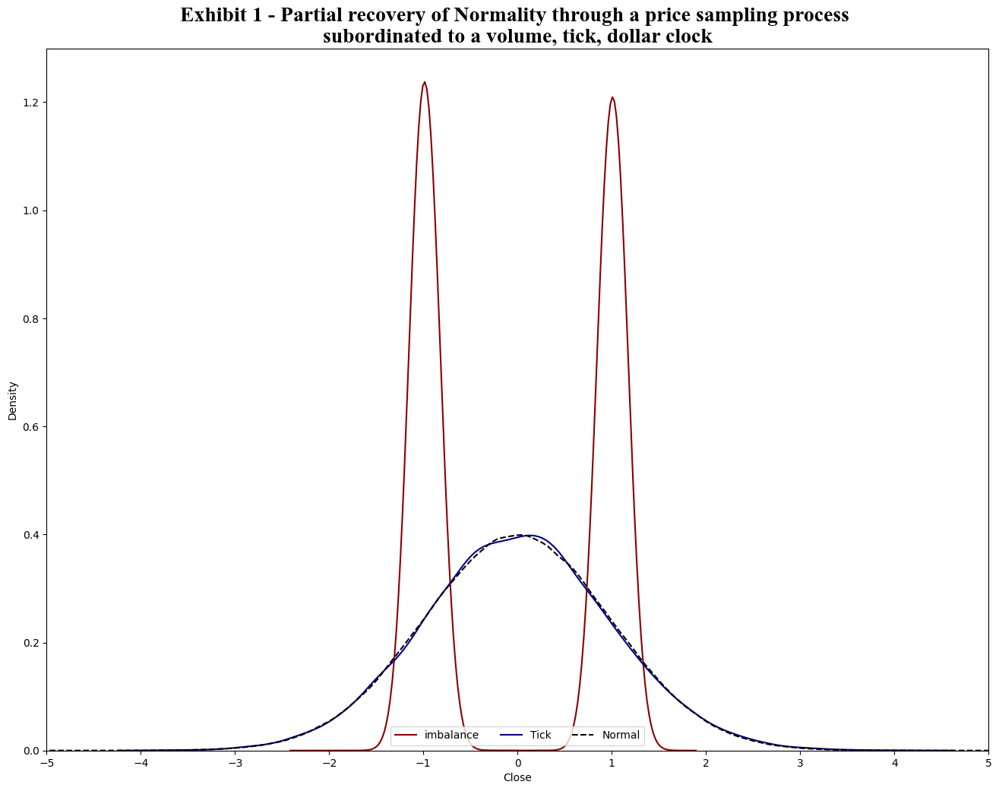

In [ ]:
# Calculate the differences
imbalance_diff = imbalance_returns
tick_diff = tick_returns


# Standardize the data
imbalance_standard = (imbalance_diff - imbalance_diff.mean()) / imbalance_diff.std()
tick_standard = (tick_diff - tick_diff.mean()) / tick_diff.std()

# Plot the Distributions
plt.figure(figsize=(16,12))
sns.kdeplot(imbalance_standard, label="imbalance", color='darkred')
sns.kdeplot(tick_standard, label="Tick", color='darkblue')
sns.kdeplot(np.random.normal(size=1000000), label="Normal", color='black', linestyle="--")

plt.xticks(range(-5, 6))
plt.legend(loc=8, ncol=5)
plt.title('Exhibit 1 - Partial recovery of Normality through a price sampling process \nsubordinated to a volume, tick, dollar clock',
          loc='center', fontsize=20, fontweight="bold", fontname="Times New Roman")
plt.xlim(-5, 5)
plt.show()

## Sampling Data: Cusum Filter

**Referencias:**
* [Video](https://www.youtube.com/watch?v=iADlO-bEA2Q&list=PLCZZtBmmgxn90kZQhaJgeAeMTLD1pRD9B&index=2) de Trade Mamba
* Capítulo 2: Data structures en la sección 2.5: Sampling Features del libro Advances in Financial Machine Learning
* [Video](https://www.youtube.com/watch?v=D_Mbmc-fUgI&t=49s) relacionado a filtros por parte de Hudson & Thames.

Según Lopez de Prado, el muestreo de barras es un paso clave por 2 razones:

1. Algunos algoritmos de ML no escalan bien con tamaños de muestras muy grandes (como SVM)
2. Los algoritmos de ML logran la máxima precisión cuando intentan aprender de ejemplos relevantes. Supongamos que desea predecir si el próximo rendimiento absoluto del 5% será positivo (un repunte del 5%) o negativo (una venta masiva del 5%). En cualquier momento aleatorio, la precisión de dicha predicción será baja. Sin embargo, si le pedimos a un clasificador que prediga el signo del próximo 5% de rendimiento absoluto después de ciertas condiciones catalíticas, es más probable que encontremos características informativas que nos ayudarán a lograr una predicción más precisa

El autor propone algunas técnicas de muestreo, la que exploraremos en este proyecto es el muestreo basado en eventos, en donde buscamos muestrar nuestras barras cada vez que surga un evento importante. Estos eventos podrían estar asociados con la publicación de algunas estadísticas macroeconómicas, un aumento en la volatilidad, una desviación significativa en un diferencial lejos de su nivel de equilibrio, etc.

En esta sección nos enfocaremos en el uso de Cusum Filter y de Z-Score Filter.

### Cusum Filter
Medida de control de calidad que intenta identificar movimientos significativos en el promedio de una serie de datos desde un nivel objetivo. MlFinlab también ofrece la función para crear los eventos usando el Filtro de Cusum. A partir de esta parte del proyecto, algunas función de MLFinalb serán utilizadas en paralelo o de forma exclusiva para nuestro proyecto debido a su escalabilidad y practicidad.

### Volatilidad dinámica

La volatilidad nos permitirá establecer el *threshold* de nuestras barreras horizontales. Se calcula con el uso de la Exponential Weighted Moving Average sobre un número específico de retornos. Los retornos se calcularán con un lag definido.

Por ejemplo, si el lag es $num_bars_lag=10$ entonces se calcula la EWM de la std de: $log(S_{11} / S_1), log(S_{12} / S_2), log(S_{13} / S_3), log(S_{14} / S_14)$


La función a continuación implementa dicho cálcula recibiendo nuestros datos de ticks (`close`), el dataframe de barras, el número de barras de lag y un valor *span* que entre más grande sea, mayor suavidad tendrá la volatilidad, y entre menor sea, tomará más en cuenta valores no tan lejanos.


In [ ]:
# @title Compute daily volatility
vol = mlf.util.get_daily_vol(close=tick_bars.Close, lookback=50)
vol

Datetime
2019-05-29 11:03:22.000         NaN
2019-05-29 13:48:22.000    0.001114
2019-05-29 16:33:22.000    0.001033
2019-05-29 19:18:22.000    0.000882
2019-05-29 22:03:22.000    0.001395
                             ...   
2024-12-08 09:41:44.130    0.002831
2024-12-08 12:26:44.131    0.002787
2024-12-08 15:11:44.129    0.002877
2024-12-08 17:56:44.120    0.002972
2024-12-08 20:41:44.133    0.003090
Name: Close, Length: 17624, dtype: float64

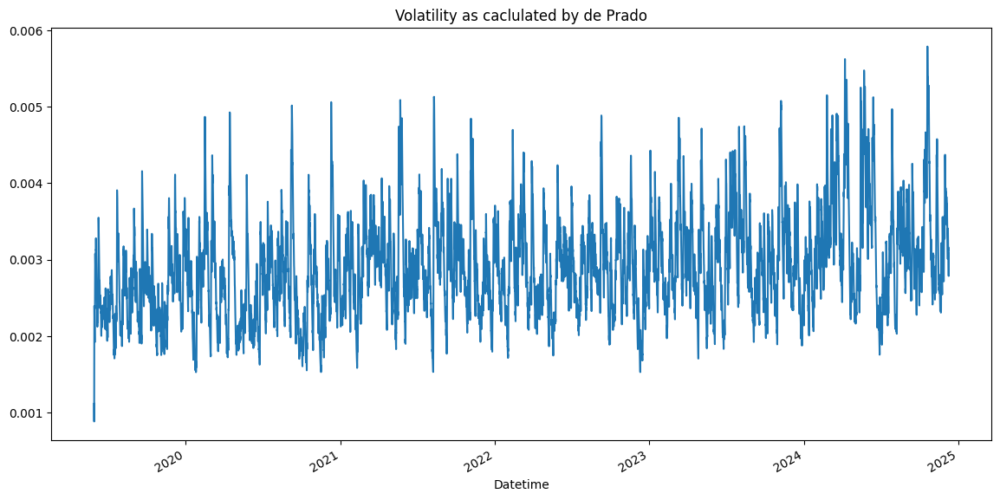

In [ ]:
vol.plot(figsize=(14, 7), title='Volatility as caclulated by de Prado')
plt.show()

In [ ]:
# @title Calcular Cusum filter
cusum_events = filters.cusum_filter(tick_bars.Close, threshold=vol.mean())
cusum_events

DatetimeIndex([       '2019-05-29 05:33:22',        '2019-05-29 19:18:22',
                      '2019-05-30 17:18:22',        '2019-05-31 09:48:22',
                      '2019-06-01 05:03:22',        '2019-06-02 08:33:22',
                      '2019-06-05 05:18:22',        '2019-06-06 14:18:22',
                      '2019-06-07 12:18:22',        '2019-06-08 04:48:22',
               ...
               '2024-12-04 03:56:51.185000', '2024-12-04 09:26:51.183000',
               '2024-12-04 23:11:51.205000', '2024-12-05 10:11:51.181000',
               '2024-12-05 23:56:51.192000', '2024-12-06 16:26:51.184000',
               '2024-12-07 00:41:51.114000', '2024-12-07 11:41:51.118000',
               '2024-12-08 04:11:44.120000', '2024-12-08 12:26:44.131000'],
              dtype='datetime64[ns]', length=2396, freq=None)

In [ ]:
tick_bars.loc[cusum_events].shape, tick_bars.shape

((2396, 4), (17633, 4))

### Z-Score Filter


Detecta desviaciones significativas en una serie temporal comparando cada punto de datos con una media móvil y una desviación estándar.  
Esta técnica calcula qué tan lejos está un punto del promedio (media) en unidades de desviación estándar (puntuación z), con un umbral específico que indica desviaciones notables.  
Puede restablecer esto o usar "mediana" para que sea más resistente a los valores atípicos.  
Se puede aplicar a cualquier serie, incluida la volatilidad o los precios logarítmicos.  
Los tamaños de ventana más pequeños son más sensibles y muestrean más puntos.

In [ ]:
def get_z_score_events(time_series,
                       mean_window_size=14,
                       std_window_size=14,
                       z_score_thresh=3):
  rolling_mean = time_series.rolling(mean_window_size).mean()
  std = time_series.rolling(std_window_size).std()
  t_events = time_series[time_series >= rolling_mean + z_score_thresh * std].index
  return t_events

In [ ]:
zscoreEvents = get_z_score_events(time_series=imbalance_bars.Close, mean_window_size=50)
zscoreEvents

DatetimeIndex([       '2019-06-10 16:14:33',        '2019-06-10 23:36:31',
                      '2019-06-11 01:00:59',        '2019-06-11 02:11:13',
                      '2019-06-11 05:03:37',        '2019-06-11 09:53:53',
                      '2019-06-11 10:27:53',        '2019-06-11 15:49:47',
                      '2019-06-12 03:53:51',        '2019-06-12 05:03:09',
               ...
               '2024-11-02 20:34:50.121000', '2024-11-21 16:10:13.184000',
               '2024-11-21 23:43:37.197000', '2024-11-22 00:44:33.208000',
               '2024-11-22 13:11:49.187000', '2024-11-22 17:14:33.190000',
               '2024-11-22 18:27:17.193000', '2024-11-22 21:01:21.146000',
               '2024-11-22 22:08:39.111000', '2024-11-23 00:10:59.123000'],
              dtype='datetime64[ns]', name='Date', length=2141, freq=None)

In [ ]:
imbalance_bars.loc[zscoreEvents].shape, imbalance_bars.shape

((2141, 7), (17365, 7))

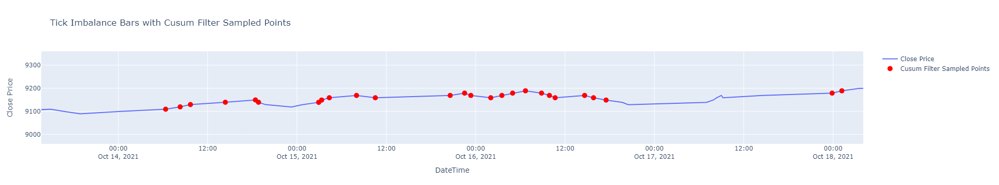

In [ ]:
line_chart = go.Figure()

line_chart.add_trace(go.Scatter(x=imbalance_bars.index, y=imbalance_bars.Close, mode='lines', name='Close Price'))
x_points = imbalance_bars.loc[zscoreEvents].index
y_points = imbalance_bars.loc[zscoreEvents].Close

line_chart.add_trace(go.Scatter(x=x_points, y=y_points, mode='markers', name='Cusum Filter Sampled Points', marker=dict(color='red', size=10)))

line_chart.update_layout(title='Tick Imbalance Bars with Cusum Filter Sampled Points', xaxis_title='DateTime', yaxis_title='Close Price')

line_chart.show()

#### MLFinlab

In [ ]:
zscoreEvents = filters.z_score_filter(raw_time_series=imbalance_bars.Close, mean_window=14, std_window=14)
zscoreEvents

DatetimeIndex([], dtype='datetime64[ns]', name='Date', freq=None)

## Labelling: Triple Barrier Method

In [ ]:
# @title Guardar etiquetas
labels.to_csv('Documents/Trading/Datasets/stepindex_binary_labels.csv')
# multiclass_labels.to_csv('Documents/Trading/Datasets/stepindex_multiclass_labels.csv')


In [ ]:
# @title Guardar Triple Barrier Events
triple_barrier_events.to_csv('Documents/Trading/Datasets/stepindex_triple_barrier_events.csv')

In [ ]:
# @title Cargar etiquetas y triple barrier method
labels = pd.read_csv('Documents/Trading/Datasets/stepindex_binary_labels.csv', index_col=0)

labels.index = pd.to_datetime(labels.index)
print(labels.head())

triple_barrier_events = pd.read_csv('Documents/Trading/Datasets/stepindex_triple_barrier_events.csv', index_col=0)
triple_barrier_events.index = pd.to_datetime(triple_barrier_events.index)
triple_barrier_events.t1 = pd.to_datetime(triple_barrier_events.t1)

# @title limpiar y actualizar triple barrier events
triple_barrier_events.dropna(inplace=True)
triple_barrier_events = triple_barrier_events.loc[labels.index]
triple_barrier_events
print(triple_barrier_events.head())

print(labels.shape)
print(triple_barrier_events.shape)

                          ret      trgt  bin
2019-05-30 17:18:22  0.003581  0.002240  1.0
2019-05-31 09:48:22  0.002830  0.002058  1.0
2019-06-01 05:03:22 -0.001910  0.003078 -1.0
2019-06-02 08:33:22 -0.000918  0.002760 -1.0
2019-06-05 05:18:22 -0.000917  0.002407 -1.0
                                     t1      trgt  pt  sl
2019-05-30 17:18:22 2019-05-31 09:48:22  0.002240   1   1
2019-05-31 09:48:22 2019-06-01 10:33:22  0.002058   1   1
2019-06-01 05:03:22 2019-06-02 05:48:22  0.003078   1   1
2019-06-02 08:33:22 2019-06-03 09:18:22  0.002760   1   1
2019-06-05 05:18:22 2019-06-06 06:03:22  0.002407   1   1
(2388, 3)
(2388, 4)


Lopez de Prado (2018) propone un método de etiquetado donde cada observación se etiqueta de acuerdo a la primera barrera tocada de tres barreras:
1. Se definen 2 barreras horizontales y una vertical: Las barreras verticales serían los límites de toma de ganancias y de stop loss, se calculan en función de la volatilidad del mercado. La barrera vertical se define en términos de la cantidad de barras transcurridas desde que se tomó la posición (un límite de vencimiento).  
2. Si la barrera superios se toca primero, etiquetamos la observación como 1. Si la barrera inferior se toca primero, etiquetamos la observación como 1. Si se toca primero la barera vertical, tenemos dos opciones: el signo del retorno o 0.

Su ventaja radica en que toma en cuenta toda la trayectoria del precio y no sólamente el retorno final en el tiempo de expiración.

### Barrera Vertical
Lo primero que haremos será obtener las barreras verticales de nuestras barras, por ejemplo, si estuvieramos usando minute time bars y el número de barras para crear una barrera es 10, entonces tendriamos el siguiente dataframe:

| Even Time | Vertical Barrier Time |
|----------|----------|
| 9:30   | 9:40   |
| 9:31    | 9:41   |
| 9:32    | 9:42   |
| 9:33    | 9:43   |

In [ ]:
# Compute vertical barrier
vertical_barriers = labeling.add_vertical_barrier(cusum_events, tick_bars.Close, num_hours=24)
vertical_barriers

2019-05-29 05:33:22.000   2019-05-30 06:18:22.000
2019-05-29 19:18:22.000   2019-05-30 20:03:22.000
2019-05-30 17:18:22.000   2019-05-31 18:03:22.000
2019-05-31 09:48:22.000   2019-06-01 10:33:22.000
2019-06-01 05:03:22.000   2019-06-02 05:48:22.000
                                    ...          
2024-12-05 10:11:51.181   2024-12-06 10:56:51.191
2024-12-05 23:56:51.192   2024-12-07 00:41:51.114
2024-12-06 16:26:51.184   2024-12-07 17:11:51.129
2024-12-07 00:41:51.114   2024-12-08 01:26:51.124
2024-12-07 11:41:51.118   2024-12-08 12:26:44.131
Name: Datetime, Length: 2394, dtype: datetime64[ns]

La función anterior retorna un dataframe con la fecha de la barra analizada y la fecha de la barra correspondiente a la barrera vertical. Recibe como parámetro el número de barras que conformarían una barrera vertical (`num_bars`) y el dataframe de barras (`bars`) que en nuestro caso son barras de tipo Tick Imbalance Bars. También los eventos cusum.

In [ ]:
(vertical_barriers - vertical_barriers.index).describe()

count                         2394
mean     1 days 00:45:44.073996658
std      0 days 00:05:19.188736228
min                1 days 00:39:24
25%                1 days 00:45:00
50%                1 days 00:45:00
75%         1 days 00:45:03.962000
max                1 days 02:31:37
dtype: object

### Obtener primer toque de cada barrera

Lopez de Prado (2018) propone una función para obtener el momento en que cada barrera es tocada por primera vez llamada `applyPtSlOnT1` en donde:
1.  se define para cada barra de nuestras Tick Imbalance Bars las 3 posibles barreras
2. las horizontales de calculan aplicando un escalar de la volatilidad en el momento de la barra analizada, si el precio logra un retorno logarítmico que alcance o supere dicho umbral entonces decimos que una barra horizontal (superior o inferior) fue alcanzada,
3. y si no entonces la barra vertical (la que define la cantidad máxima de barras que puede durar el precio en tocar una barra superior o inferior) es la que es alcanzada.
4. Retornamos el dataframe que contiene:  
  a. la fecha de la barrera vertical (`vertical_barrier`).  
  b. la fecha de cuando tocó la barrera horizontal superior si es que la tocó (`upper_barrier_earliest`).  
  c. la fecha de cuando tocó la barrera horizontal inferior si es que la tocó (`lower_barrier_earliest`).  
  d. la fecha de la barrera que fue tocada primero, puede ser cualquiera de las 3 barreras.

A continuación hacemos uso de la función `get_events` de MLFinlab que recibe como parámetros:
* t_events: Los eventos identificados sobre los cuales se empezará a calcular el primer toque de barrera, en nuestro caso usamos Cusum EVents  
* pt_sl: Relación riesgo/beneficio de las barreras horizontales.  
* target: Serie de valores que se utilizan (en conjunto con pt_sl) para determinar el ancho de la barrera. En este programa, se trata de series de volatilidad diarias.  
* min_ret: El retorno objetivo mínimo requerido para ejecutar una búsqueda de triple barrera.  

Nos retorna el momento en que se toca una de las tres barrearas (columna `t1`), el target utilizado y la relación take profit y sl utiilzada.

In [ ]:
triple_barrier_events = labeling.get_events(close=tick_bars.Close,
                                               t_events=cusum_events,
                                               pt_sl=[1, 1],
                                               target=vol,
                                               min_ret=0.001,
                                               num_threads=4,
                                               vertical_barrier_times=vertical_barriers,
                                               side_prediction=None)
triple_barrier_events

2025-01-07 19:21:17.556352 100.0% apply_pt_sl_on_t1 done after 0.1 minutes. Remaining 0.0 minutes.


,t1,trgt,pt,sl
2019-05-30 17:18:22.000,2019-05-31 09:48:22.000,0.002240,1,1
2019-05-31 09:48:22.000,2019-06-01 10:33:22.000,0.002058,1,1
2019-06-01 05:03:22.000,2019-06-02 05:48:22.000,0.003078,1,1
2019-06-02 08:33:22.000,2019-06-03 09:18:22.000,0.002760,1,1
2019-06-05 05:18:22.000,2019-06-06 06:03:22.000,0.002407,1,1
...,...,...,...,...
2024-12-06 16:26:51.184,2024-12-07 06:11:51.119,0.003373,1,1
2024-12-07 00:41:51.114,2024-12-07 11:41:51.118,0.003300,1,1
2024-12-07 11:41:51.118,2024-12-08 04:11:44.120,0.003110,1,1
2024-12-08 04:11:44.120,2024-12-08 12:26:44.131,0.002941,1,1


El siguiente dataset es el resultado de aplicando un escalar de 1 tanto para la barrera inferior como para la superior.

### Generar las Etiquetas

Ya que tenemos los momentos en que cada barrera fue tocada para cada barra de nuestro dataset de Tick Imbalance Bars, nos quedaría generar las etiquetas que nos indiquen cuál nivel alcanzó cada observación. Tenemos dos formas de hacerlo:

1. Multiclase: Etiquetando con un 1 si alcanzó la barrera superior primero, con un -1 si alcanzó la barrera inferior primero y con un 0 si alcanzó la barrera vertical primero.
2. Binaria: Igual que la primera pero, si el precio alcanzó primero la barrera vertical, etiquetamos esa observación con el signo del retorno. Es decir, si generó un retorno positivo entonces la etiquetamos como 1, y si genera un retorno negativo la etiquetamos como -1.

Lopez de Prado (2018) nos dice; "Personalmente prefiero la primera opción para obtener ganancias o pérdidas dentro de ciertos límites, pero deberías explorar si un 0 funciona mejor en tus problemas particulares", por lo que exploraremos ambas opciones.

#### Etiquetas multiclase

In [ ]:
multiclass_labels = labeling.get_bins(triple_barrier_events, tick_bars.Close, binary=False)
multiclass_labels

,ret,trgt,bin
2019-05-30 17:18:22.000,0.003581,0.002240,1
2019-05-31 09:48:22.000,0.002830,0.002058,1
2019-06-01 05:03:22.000,-0.001910,0.003078,0
2019-06-02 08:33:22.000,-0.000918,0.002760,0
2019-06-05 05:18:22.000,-0.000917,0.002407,0
...,...,...,...
2024-12-05 23:56:51.192,0.000024,0.003167,0
2024-12-06 16:26:51.184,-0.003426,0.003373,-1
2024-12-07 00:41:51.114,-0.003631,0.003300,-1
2024-12-07 11:41:51.118,0.003461,0.003110,1


In [ ]:
print(multiclass_labels.shape)
multiclass_labels = labeling.drop_labels(multiclass_labels)
print(multiclass_labels.shape)

(2393, 3)
(2393, 3)


In [ ]:
multiclass_labels.bin.value_counts()

bin
 0    1014
-1     711
 1     668
Name: count, dtype: int64

#### Etiquetas binarias

**Calcular los retornos logaritmicos:**

El primero paso sería calcular los retornos que se obtuvieron en cada observación tomando en cuenta cuál barrera fue alcanzda primero para más adelante generar la etiqueta que corresponda al signo de dicho retorno. **Obtener las etiquetas binarias**  
Una vez se calculan los retornos, podemos asignar las etiquetas al signo de dichos retornos.

La función get_bins de MLFinlab realiza el proceso.

In [ ]:
binary_labels = labeling.get_bins(triple_barrier_events, tick_bars.Close, binary=True)
binary_labels

,ret,trgt,bin
2019-05-30 17:18:22.000,0.003581,0.002240,1.0
2019-05-31 09:48:22.000,0.002830,0.002058,1.0
2019-06-01 05:03:22.000,-0.001910,0.003078,-1.0
2019-06-02 08:33:22.000,-0.000918,0.002760,-1.0
2019-06-05 05:18:22.000,-0.000917,0.002407,-1.0
...,...,...,...
2024-12-05 23:56:51.192,0.000024,0.003167,1.0
2024-12-06 16:26:51.184,-0.003426,0.003373,-1.0
2024-12-07 00:41:51.114,-0.003631,0.003300,-1.0
2024-12-07 11:41:51.118,0.003461,0.003110,1.0


In [ ]:
print(binary_labels.shape)
binary_labels = labeling.drop_labels(binary_labels)
print(binary_labels.shape)
print(binary_labels.bin.value_counts())

(2393, 3)
dropped label:  0.0 0.002089427496865859
(2388, 3)
bin
-1.0    1217
 1.0    1171
Name: count, dtype: int64


### Elección de etiquetas
Tal y como prefiere lopez de prado, exploraremos el uso de etiquetas binarias.

In [ ]:
labels = binary_labels
# labels = multiclass_labels

In [ ]:
# @title limpiar y actualizar triple barrier events
triple_barrier_events.dropna(inplace=True)
triple_barrier_events = triple_barrier_events.loc[labels.index]
triple_barrier_events

,t1,trgt,pt,sl
2019-05-30 17:18:22.000,2019-05-31 09:48:22.000,0.002240,1,1
2019-05-31 09:48:22.000,2019-06-01 10:33:22.000,0.002058,1,1
2019-06-01 05:03:22.000,2019-06-02 05:48:22.000,0.003078,1,1
2019-06-02 08:33:22.000,2019-06-03 09:18:22.000,0.002760,1,1
2019-06-05 05:18:22.000,2019-06-06 06:03:22.000,0.002407,1,1
...,...,...,...,...
2024-12-05 23:56:51.192,2024-12-07 00:41:51.114,0.003167,1,1
2024-12-06 16:26:51.184,2024-12-07 06:11:51.119,0.003373,1,1
2024-12-07 00:41:51.114,2024-12-07 11:41:51.118,0.003300,1,1
2024-12-07 11:41:51.118,2024-12-08 04:11:44.120,0.003110,1,1


## Concurrent MLFinlab



Supongamos que las etiquetas son $y_1 ..... y_I$, Las etiquetas $y_i$ e $y_j$; son concurrentes cuando ambas son una función de al menos un retorno común

$\text{Simple returns: } r_{t-1,t} = \frac{P-P_{t-1}}{P_{t-1}} \text{ or Log Returns: } r_{t-1, t} = \log(\frac{P_t}{p_{t-1}})$

Sea $t_{i, 0}$ la primera marca de tiempo en la etiqueta $y_i$, y $t_{i, 1}$ la última marca de tiempo inclusive.

$I_{t, i} = 1 \text{ si y solo si } [t_{i, 0}, t_{i, 1}] \text{se superpone con } [t-1,1] \text{, de lo contrario } 0$

El número total de etiquetas simultáneas en el tiempo $t$ se define como

$c_t = \sum_{i=1}^{I} 1_{t,i}$

La unicidad de la etiqueta $i$ en el momento $t$ es

$u_{t,i} = 1_{t,i}c_t^{-1}$

Primero realizamos el cálculo del número de overlapping outcomes a lo largo del tiempo de nuestras tick imbalance bars.

In [ ]:
num_threads = 4
num_conc_events = multiprocess.mp_pandas_obj(concurrent.num_concurrent_events, ('molecule', triple_barrier_events.index), num_threads,
                                            close_series_index=tick_bars.index, label_endtime=triple_barrier_events['t1'])

2025-01-05 12:51:33.607111 100.0% num_concurrent_events done after 0.09 minutes. Remaining 0.0 minutes.
C:\Users\angel\AppData\Local\Programs\Python\Python311\Lib\site-packages\mlfinlab\util\multiprocess.py:137: FutureWarning:

The behavior of array concatenation with empty entries is deprecated. In a future version, this will no longer exclude empty items when determining the result dtype. To retain the old behavior, exclude the empty entries before the concat operation.



In [ ]:
# eliminate the duplicates
num_conc_events = num_conc_events.loc[~num_conc_events.index.duplicated(keep='last')]

# reindex based on the close prices
num_conc_events = num_conc_events.reindex(tick_bars.index).fillna(0)
len(num_conc_events)

17633

A continuación graficamos la serie temporal del número de etiquetas simultáneas en el eje principal y la serie temporal de la desviación estándar móvil ponderada exponencialmente de los retornos en el eje secundario.

In [ ]:
display_df = (pd.DataFrame()
              .assign(vol=vol,
                     num_conc_events=num_conc_events)
              .drop_duplicates().dropna()
             )

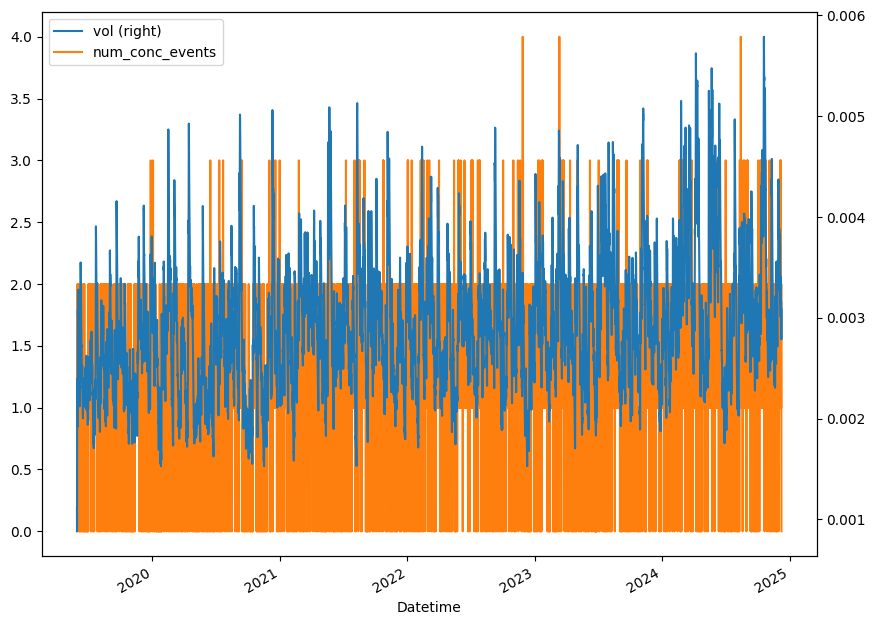

In [ ]:
# display_df.plot()
display_df[['vol', 'num_conc_events']].plot(secondary_y='vol', figsize=(10,8))
plt.show()

Generamos un diagrama de dispersión del número de etiquetas simultáneas (eje x) y la desviación estándar móvil ponderada exponencialmente de los retornos (eje y). ¿Puede apreciar la relación?

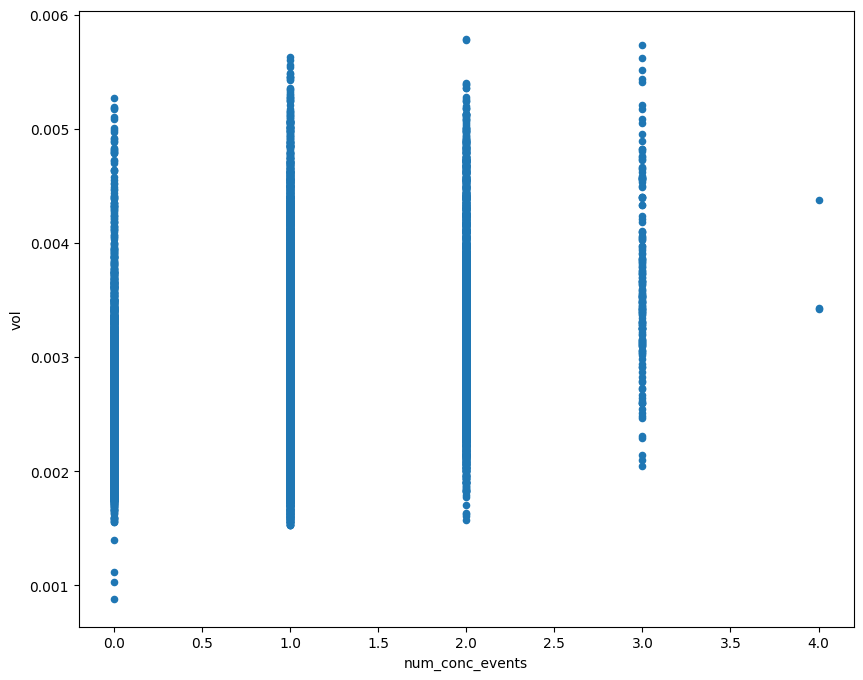

In [ ]:
display_df.plot.scatter(x='num_conc_events', y='vol', figsize=(10, 8))
plt.show()

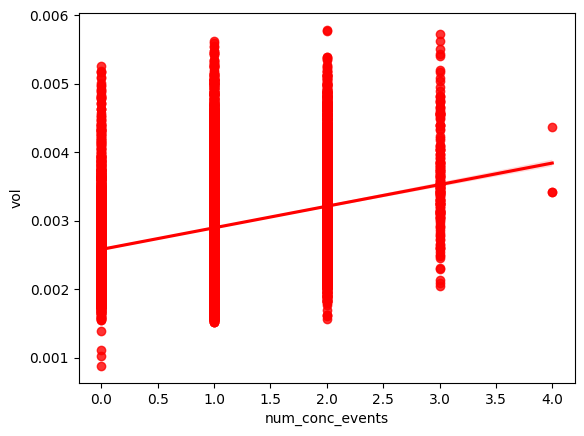

In [ ]:
sns.regplot(x=display_df['num_conc_events'], y=display_df['vol'], color='r')
plt.show()

También podemos realizar el cálculo del average uniqueness de cada etiqueta.

In [ ]:
out = multiprocess.mp_pandas_obj(concurrent._get_average_uniqueness, ('molecule', triple_barrier_events.index), num_threads,
                                 label_endtime=triple_barrier_events['t1'], num_conc_events=num_conc_events)

2025-01-04 10:56:50.216046 100.0% _get_average_uniqueness done after 0.1 minutes. Remaining 0.0 minutes.
C:\Users\angel\AppData\Local\Programs\Python\Python311\Lib\site-packages\mlfinlab\util\multiprocess.py:137: FutureWarning:

The behavior of array concatenation with empty entries is deprecated. In a future version, this will no longer exclude empty items when determining the result dtype. To retain the old behavior, exclude the empty entries before the concat operation.



<Axes: xlabel='Lag', ylabel='Autocorrelation'>

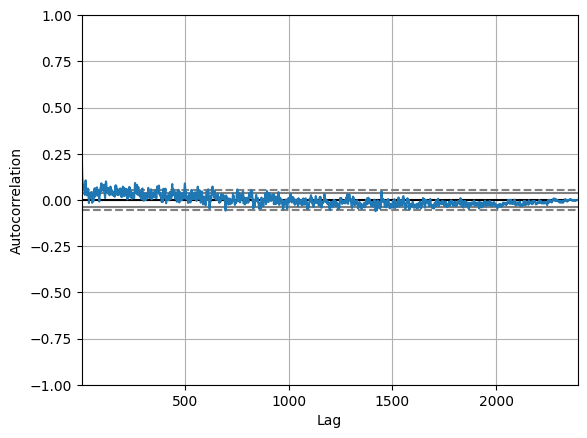

In [ ]:
#ACF plot
pd.plotting.autocorrelation_plot(out, )

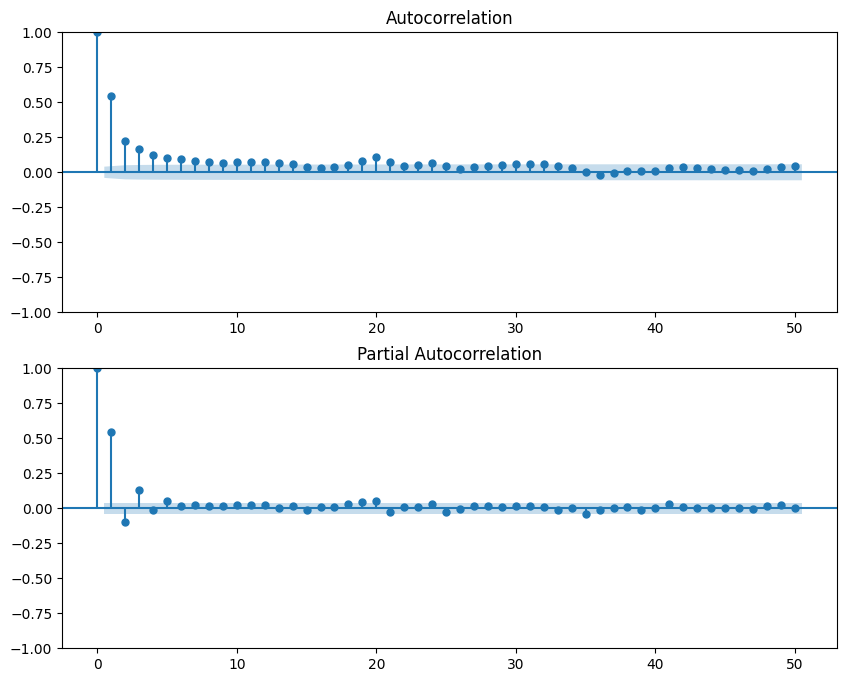

In [ ]:
plt.figure(figsize=(10, 8))
plt.subplot(211)
plot_acf(out, ax=plt.gca(), lags=50)
plt.subplot(212)
plot_pacf(out, ax=plt.gca(), lags=50)
plt.show()

 We can measure average label uniqueness using get_av_uniqueness_from_tripple_barrier function from mlfinlab package

In [ ]:
av_unique = concurrent.get_av_uniqueness_from_triple_barrier(triple_barrier_events.dropna(), tick_bars.Close, num_threads=3)

2025-01-04 19:02:48.570124 100.0% num_concurrent_events done after 0.09 minutes. Remaining 0.0 minutes.
C:\Users\angel\AppData\Local\Programs\Python\Python311\Lib\site-packages\mlfinlab\util\multiprocess.py:137: FutureWarning:

The behavior of array concatenation with empty entries is deprecated. In a future version, this will no longer exclude empty items when determining the result dtype. To retain the old behavior, exclude the empty entries before the concat operation.

2025-01-04 19:02:55.101268 100.0% _get_average_uniqueness done after 0.1 minutes. Remaining 0.0 minutes.
C:\Users\angel\AppData\Local\Programs\Python\Python311\Lib\site-packages\mlfinlab\util\multiprocess.py:137: FutureWarning:

The behavior of array concatenation with empty entries is deprecated. In a future version, this will no longer exclude empty items when determining the result dtype. To retain the old behavior, exclude the empty entries before the concat operation.



In [ ]:
av_unique.mean()

tW    0.803497
dtype: float64

Let's look at one of the labels which have average uniqueness equal to 1 which means that it doesn't use any information from other labels

In [ ]:
unique_label_index = av_unique[av_unique.tW == 1].index[0] # take the first sample
triple_barrier_events[triple_barrier_events.index >= unique_label_index].head()

,t1,trgt,pt,sl
2019-06-02 08:33:22,2019-06-03 09:18:22,0.002760,1,1
2019-06-05 05:18:22,2019-06-06 06:03:22,0.002407,1,1
2019-06-06 14:18:22,2019-06-07 12:18:22,0.002262,1,1
2019-06-07 12:18:22,2019-06-07 15:03:22,0.002276,1,1
2019-06-08 04:48:22,2019-06-08 13:03:22,0.002409,1,1


As you can see sample 2019-06-02 08:33:22 doesn't use any information from 2019-06-02 02:28:22 which is the next label.

We would like to build our model in such a way that it takes into account labels concurrency. In order to do that we need to look at bootstrapping algorithm of Random Forest.

In [ ]:
av_unique

,tW
2019-05-30 17:18:22.000,0.928571
2019-05-31 09:48:22.000,0.800000
2019-06-01 05:03:22.000,0.850000
2019-06-02 08:33:22.000,1.000000
2019-06-05 05:18:22.000,1.000000
...,...
2024-12-05 23:56:51.192,0.533333
2024-12-06 16:26:51.184,0.472222
2024-12-07 00:41:51.114,0.566667
2024-12-07 11:41:51.118,0.857143


## Sequential Bootstrap MLFinlab

In [ ]:
# @title Guardar Boot Barrier events
boot_barrier_events.to_csv('Documents/Trading/Datasets/stepindex_boot_barrier_events.csv')

In [ ]:
# @title Cargar boot barrier events
boot_barrier_events = pd.read_csv('Documents/Trading/Datasets/stepindex_boot_barrier_events.csv', index_col=0)
boot_barrier_events.index = pd.to_datetime(boot_barrier_events.index)
boot_barrier_events.t1 = pd.to_datetime(boot_barrier_events.t1)
boot_barrier_events

,t1,trgt,pt,sl
index,,,,
2019-05-31 09:48:22.000,2019-06-01 10:33:22.000,0.002058,1,1
2019-06-01 05:03:22.000,2019-06-02 05:48:22.000,0.003078,1,1
2019-06-05 05:18:22.000,2019-06-06 06:03:22.000,0.002407,1,1
2019-06-06 14:18:22.000,2019-06-07 12:18:22.000,0.002262,1,1
2019-06-08 04:48:22.000,2019-06-08 13:03:22.000,0.002409,1,1
...,...,...,...,...
2024-11-28 21:27:09.171,2024-11-29 08:27:09.191,0.003327,1,1
2024-12-04 23:11:51.205,2024-12-05 10:11:51.181,0.003559,1,1
2024-12-05 23:56:51.192,2024-12-07 00:41:51.114,0.003167,1,1


The next problem in financial machine learning is non-independent samples as a result of that standard machine learning models like Random Forest and Bagging Classifier need to be modified. In this notebook we will tackle the problem of concurrency and the solution to that - **Sequential Bootstrapping**.

The key power of ensemble learning techniques is bagging (which is bootstrapping with replacement). The key idea behind bagging is to randomly choose samples for each decision tree. In this case trees become diverse and by averaging predictions of diverse tress built on randomly selected samples and random subset of features data scientists make the algorithm much less prone to overfit.

However, in our case we would not only like to randomly choose samples but also choose samples which are unique and non-concurrent. But how can we solve this problem? Here comes Sequential Bootstrapping algorithm.

The key idea behind Sequential Bootstrapping is to select samples in such a way that on each iteration we maximize average uniqueness of selected subsamples.

The first thing we need to do is to build and indicator matrix. Columns of this matrix correspond to samples and rows correspond to price returns timestamps which were used during samples labelling. In our case indicator matrix is

In [ ]:
triple_barrier_ind_mat = bootstrapping.get_ind_matrix(triple_barrier_events.t1, tick_bars)
triple_barrier_ind_mat

array([[1., 0., 0., ..., 0., 0., 0.],
       [1., 0., 0., ..., 0., 0., 0.],
       [1., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 1.],
       [0., 0., 0., ..., 0., 0., 1.],
       [0., 0., 0., ..., 0., 0., 1.]])

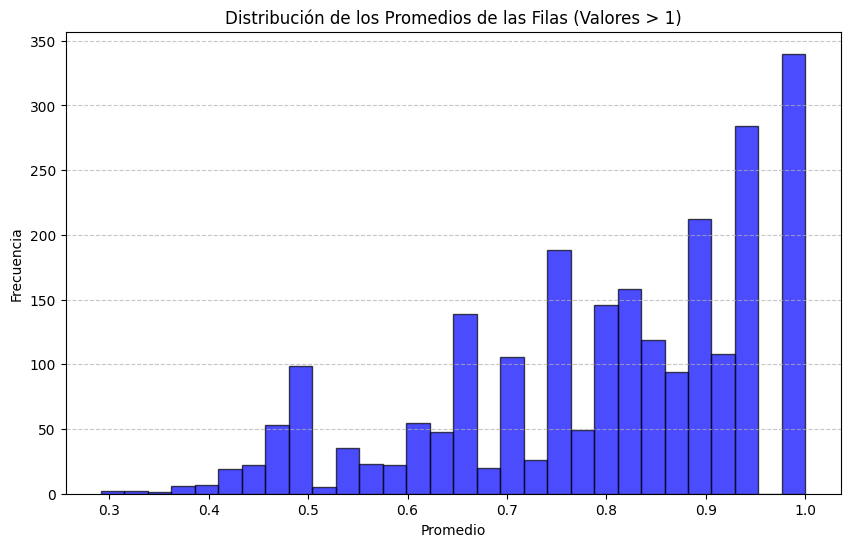

In [ ]:
label_uniqueness = bootstrapping.get_ind_mat_label_uniqueness(triple_barrier_ind_mat)
mascara = label_uniqueness > 0
promedios_filas = np.nanmean(np.where(mascara, label_uniqueness, np.nan), axis=1)

# Paso 3: Generar el histograma de los promedios
plt.figure(figsize=(10, 6))
plt.hist(promedios_filas, bins=30, color='blue', edgecolor='black', alpha=0.7)
plt.title('Distribución de los Promedios de las Filas (Valores > 1)')
plt.xlabel('Promedio')
plt.ylabel('Frecuencia')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

We can get average label uniqueness on indicator matrix using get_ind_mat_average_uniqueness function from mlfinlab.

In [ ]:
ind_mat_uniqueness = bootstrapping.get_ind_mat_average_uniqueness(triple_barrier_ind_mat)
ind_mat_uniqueness

0.6185220729366603

Let's apply sequential bootstrapping to our full data set and draw 50 samples.

In [ ]:
# @title Calculo de sequential bootstrap
bootstrapped_samples = bootstrapping.seq_bootstrap(triple_barrier_ind_mat, compare=True, sample_length=1100, verbose=False)

Standard uniqueness: 0.7503249438733308
Sequential uniqueness: 0.8213243022305267


In [ ]:
boot_barrier_events = triple_barrier_events.reset_index().sort_values(by=['index']).loc[bootstrapped_samples].set_index('index')
boot_barrier_events.sort_index(inplace=True)
boot_barrier_events = boot_barrier_events[~boot_barrier_events.index.duplicated(keep='first')]
boot_barrier_events

,t1,trgt,pt,sl
index,,,,
2019-05-31 09:48:22.000,2019-06-01 10:33:22.000,0.002058,1,1
2019-06-01 05:03:22.000,2019-06-02 05:48:22.000,0.003078,1,1
2019-06-05 05:18:22.000,2019-06-06 06:03:22.000,0.002407,1,1
2019-06-06 14:18:22.000,2019-06-07 12:18:22.000,0.002262,1,1
2019-06-08 04:48:22.000,2019-06-08 13:03:22.000,0.002409,1,1
...,...,...,...,...
2024-11-28 21:27:09.171,2024-11-29 08:27:09.191,0.003327,1,1
2024-12-04 23:11:51.205,2024-12-05 10:11:51.181,0.003559,1,1
2024-12-05 23:56:51.192,2024-12-07 00:41:51.114,0.003167,1,1


In [ ]:
bootstrapped_bars = tick_bars.loc[boot_barrier_events.index]
bootstrapped_bars

,Open,High,Low,Close
index,,,,
2019-05-31 09:48:22.000,10014.9,10034.5,10011.7,10034.0
2019-06-01 05:03:22.000,10047.1,10065.2,10046.6,10053.0
2019-06-05 05:18:22.000,10015.9,10030.3,10013.5,10029.4
2019-06-06 14:18:22.000,10025.3,10027.5,10004.0,10005.4
2019-06-08 04:48:22.000,9979.5,9993.5,9978.2,9992.0
...,...,...,...,...
2024-11-28 21:27:09.171,8281.0,8283.0,8261.4,8261.5
2024-12-04 23:11:51.205,8217.5,8233.8,8216.5,8233.8
2024-12-05 23:56:51.192,8194.9,8206.7,8189.7,8206.6


<Axes: xlabel='index'>

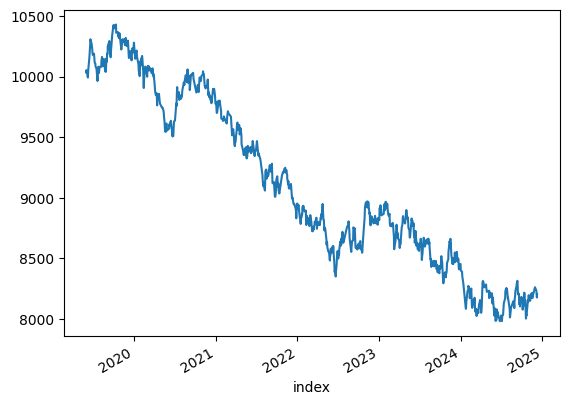

In [ ]:
bootstrapped_bars.Close.plot()

Ahora podemos visualizar la unicidad de las nuevas barras

2025-01-07 11:30:53.109688 100.0% num_concurrent_events done after 0.1 minutes. Remaining 0.0 minutes.
C:\Users\angel\AppData\Local\Programs\Python\Python311\Lib\site-packages\mlfinlab\util\multiprocess.py:137: FutureWarning:

The behavior of array concatenation with empty entries is deprecated. In a future version, this will no longer exclude empty items when determining the result dtype. To retain the old behavior, exclude the empty entries before the concat operation.



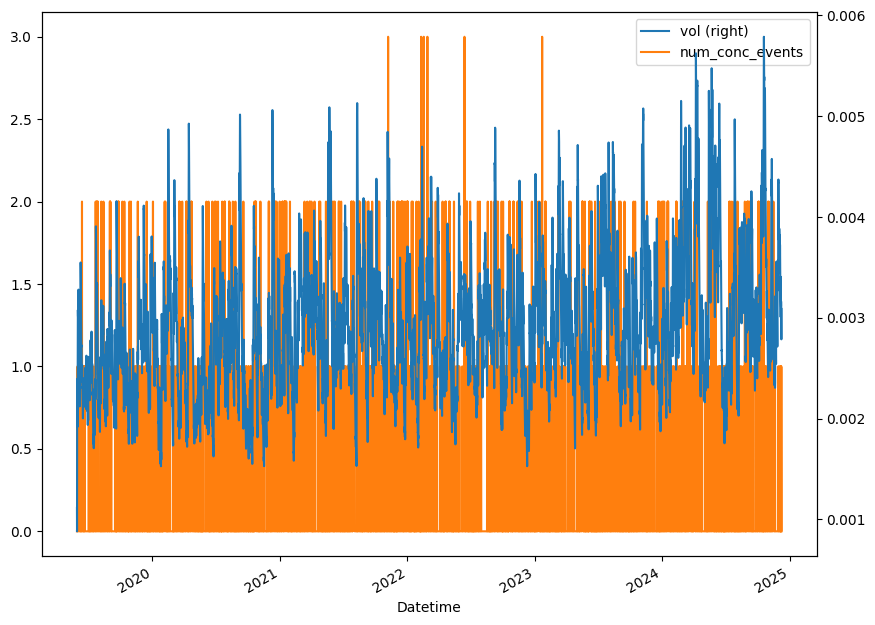

In [ ]:
num_threads = 4
num_conc_events = multiprocess.mp_pandas_obj(concurrent.num_concurrent_events, ('molecule', boot_barrier_events.index), num_threads,
                                            close_series_index=tick_bars.index, label_endtime=boot_barrier_events['t1'])
# eliminate the duplicates
num_conc_events = num_conc_events.loc[~num_conc_events.index.duplicated(keep='last')]

# reindex based on the close prices
num_conc_events = num_conc_events.reindex(tick_bars.index).fillna(0)
len(num_conc_events)
display_boot_df = (pd.DataFrame()
              .assign(vol=vol,
                     num_conc_events=num_conc_events)
              .drop_duplicates().dropna()
             )

# display_boot_df.plot()
display_boot_df[['vol', 'num_conc_events']].plot(secondary_y='vol', figsize=(10,8))
plt.show()

In [ ]:
av_unique = concurrent.get_av_uniqueness_from_triple_barrier(boot_barrier_events.dropna(), tick_bars.Close, num_threads=6)
av_unique.mean()

2025-01-07 11:31:28.433880 100.0% num_concurrent_events done after 0.11 minutes. Remaining 0.0 minutes.
C:\Users\angel\AppData\Local\Programs\Python\Python311\Lib\site-packages\mlfinlab\util\multiprocess.py:137: FutureWarning:

The behavior of array concatenation with empty entries is deprecated. In a future version, this will no longer exclude empty items when determining the result dtype. To retain the old behavior, exclude the empty entries before the concat operation.

2025-01-07 11:31:36.006185 100.0% _get_average_uniqueness done after 0.11 minutes. Remaining 0.0 minutes.
C:\Users\angel\AppData\Local\Programs\Python\Python311\Lib\site-packages\mlfinlab\util\multiprocess.py:137: FutureWarning:

The behavior of array concatenation with empty entries is deprecated. In a future version, this will no longer exclude empty items when determining the result dtype. To retain the old behavior, exclude the empty entries before the concat operation.



tW    0.92831
dtype: float64

Sometimes you would see that standard bootstrapping gives higher uniqueness, however as it was shown in Monte-Carlo example, on average Sequential Bootstrapping algorithm has higher average uniqueness.

### Monte Carlo Experiment
Let's see how sequential bootstrapping increases average label uniqueness on this example by generating 3 samples using sequential bootstrapping and 3 samples using standard random choise, repeat the experiment 10000 times and record corresponding label uniqueness in each experiment

In [ ]:
standard_unq_array = np.zeros(1000) * np.nan # Array of random sampling uniqueness
seq_unq_array = np.zeros(1000) * np.nan # Array of Sequential Bootstapping uniqueness
for i in range(0, 1000):
    bootstrapped_samples = bootstrapping.seq_bootstrap(triple_barrier_ind_mat, sample_length=500)
    random_samples = np.random.choice(triple_barrier_ind_mat.shape[1], size=500)

    random_unq = bootstrapping.get_ind_mat_average_uniqueness(triple_barrier_ind_mat[:, random_samples])

    sequential_unq = bootstrapping.get_ind_mat_average_uniqueness(triple_barrier_ind_mat[:, bootstrapped_samples])

    standard_unq_array[i] = random_unq
    seq_unq_array[i] = sequential_unq

KeyboardInterrupt: 

In [ ]:
np.median(standard_unq_array), np.median(seq_unq_array)

In [ ]:
np.mean(standard_unq_array), np.mean(seq_unq_array)

## Fractional Differencing


One of the challenges of quantitative analysis in finance is that price time series have trends or non-constant mean. This makes the time series non-stationary.  Non-stationary time series are hard to work with when we want to do inferential analysis such as average and variance of returns, or probability of loss.  Stationary series also help in supervised learning methods. Specifically, in supervised learning one needs to map hitherto unseen observations to a set of labeled examples and determine the label of the new observation.  As Marcos Lopez de Prado (MLdP) says in Chapter 5, “if the features are not stationary we cannot map the new observation to a large number of known examples”.  However, to make a time series (or a feature) stationary often requires data transformations like computing changes (change in price, yields or volatility).  These transformations also leave the time series bereft of any memory and thereby reducing or eliminating its predictive capability.  This chapter discusses ways to preserve as much memory as possible while transforming the series into a stationary time series. Or, proverbially “to have your cake and eat it too”.


In [ ]:
adf = lambda s: adfuller(s, autolag='AIC')
p_val = lambda s: adfuller(s, autolag='AIC')[1]

In [ ]:
def adf_test(series):
    """Using an ADF test to determine if a series is stationary"""
    # test_results = adfuller(series)
    test_results = adfuller(series, maxlag=1, regression='c', autolag=None)
    print('ADF Statistic: ', test_results[0])
    print('P-Value: ', test_results[1])
    print('Critical Values:')
    for thres, adf_stat in test_results[4].items():
        print('\t%s: %.2f' % (thres, adf_stat))


adf_test(tick_bars["Close"])

ADF Statistic:  -0.9088889969987846
P-Value:  0.785031050303906
Critical Values:
	1%: -3.43
	5%: -2.86
	10%: -2.57


In [ ]:
# Aplica relleno de valores nulos si los hay
close_prices = tick_bars.Close.to_frame()
close_prices

,Close
Datetime,
2019-05-28 10:18:22.000,10044.8
2019-05-28 13:03:22.000,10031.2
2019-05-28 15:48:22.000,10034.6
2019-05-28 18:33:22.000,10029.8
2019-05-28 21:18:22.000,10034.0
...,...
2024-12-08 09:41:44.130,8186.7
2024-12-08 12:26:44.131,8159.9
2024-12-08 15:11:44.129,8145.3


<Axes: xlabel='Datetime'>

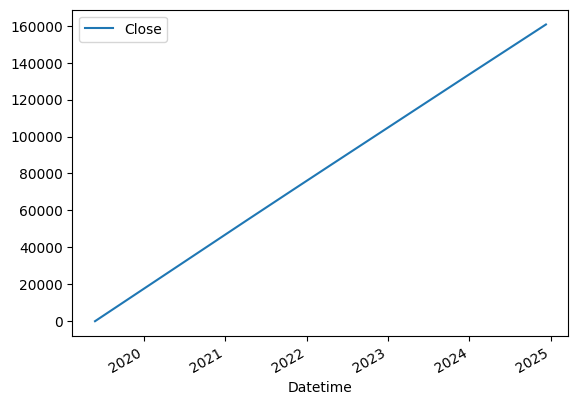

In [ ]:
log_prices = np.log(close_prices).cumsum()
log_prices.plot()

array([[<Axes: title={'center': 'Close'}>]], dtype=object)

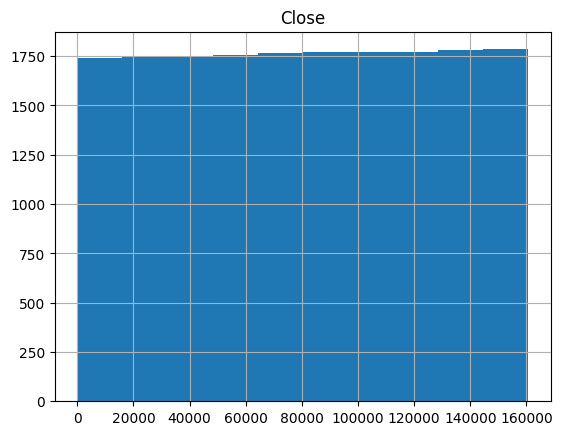

In [ ]:
log_prices.hist()

<Axes: xlabel='Datetime'>

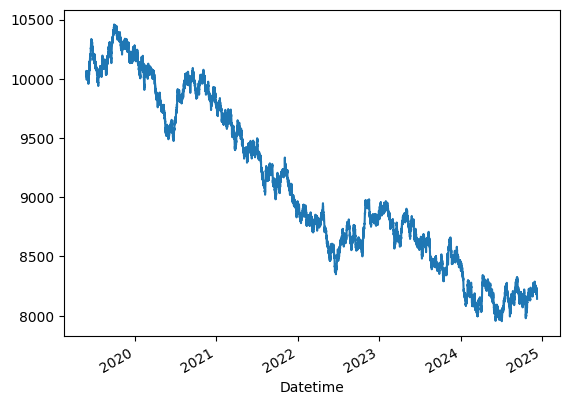

In [ ]:
close_prices.Close.plot()

In [ ]:
d = 1.999999979
fd_series = fracdiff.frac_diff_ffd(log_prices, diff_amt=d, thresh=1e-5)

C:\Users\angel\AppData\Local\Programs\Python\Python311\Lib\site-packages\mlfinlab\features\fracdiff.py:187: FutureWarning:

DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.



In [ ]:
p_val(fd_series['Close'].dropna())

6.438887754635997e-08

In [ ]:
def plot_min_ffd(close_prices, thresh=0.01):
    out = pd.DataFrame(columns=['adfStat', 'pVal', 'lags', 'nObs', '95% conf', 'corr'])
    for d in np.linspace(0, 1, 10):
        df1 = np.log(close_prices[['Close']])
        # df1 = np.log(close_prices).cumsum()
        df1.dropna(inplace=True)
        df2 = fracdiff.frac_diff_ffd(df1, diff_amt=d, thresh=thresh).dropna()
        corr = np.corrcoef(df1.loc[df2.index, 'Close'], df2['Close'])[0, 1]
        df2 = adfuller(df2['Close'], maxlag=1, regression='c', autolag=None)
        # print(df2[4]['5%'])
        out.loc[d] = list(df2[:4]) + [df2[4]['5%']] + [corr]  # with critical value
    out[['adfStat', 'corr']].plot(secondary_y='adfStat', figsize=(10, 8))
    plt.axhline(out['95% conf'].mean(), linewidth=1, color='r', linestyle='dotted')
    return out

C:\Users\angel\AppData\Local\Programs\Python\Python311\Lib\site-packages\mlfinlab\features\fracdiff.py:187: FutureWarning:

DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.

C:\Users\angel\AppData\Local\Programs\Python\Python311\Lib\site-packages\mlfinlab\features\fracdiff.py:187: FutureWarning:

DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.

C:\Users\angel\AppData\Local\Programs\Python\Python311\Lib\site-packages\mlfinlab\features\fracdiff.py:187: FutureWarning:

DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.

C:\Users\angel\AppData\Local\Programs\Python\Python311\Lib\site-packages\mlfinlab\features\fracdiff.py:187: FutureWarning:

DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.

C:\Users\angel\A

,adfStat,pVal,lags,nObs,95% conf,corr
0.000000,-0.876838,7.955042e-01,1.0,17631.0,-2.861704,1.000000
0.111111,-1.189555,6.780728e-01,1.0,17616.0,-2.861704,0.999955
0.222222,-1.787932,3.864693e-01,1.0,17612.0,-2.861704,0.999662
0.333333,-2.720434,7.056852e-02,1.0,17613.0,-2.861704,0.998884
0.444444,-4.154680,7.854677e-04,1.0,17615.0,-2.861704,0.997064
0.555556,-6.213500,5.435641e-08,1.0,17618.0,-2.861704,0.993325
0.666667,-9.293435,1.163121e-15,1.0,17621.0,-2.861704,0.985362
0.777778,-15.392157,3.298889e-28,1.0,17623.0,-2.861704,0.960920
0.888889,-26.075338,0.000000e+00,1.0,17626.0,-2.861704,0.895683
1.000000,-94.117460,0.000000e+00,1.0,17630.0,-2.861704,0.007501


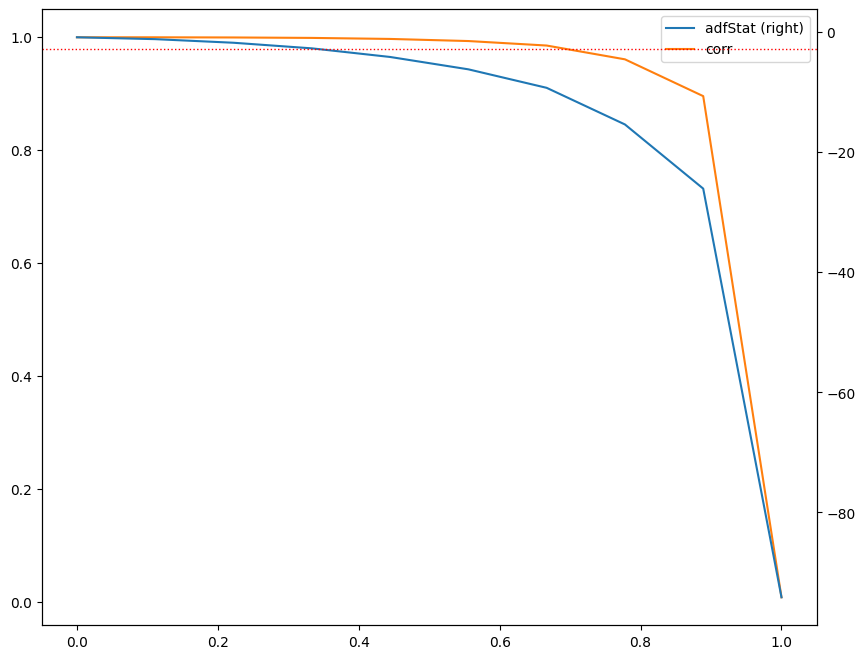

In [ ]:
thresh = 0.005   # Umbral mínimo para pesos
plot_min_ffd(close_prices, thresh)

La serie original tiene un estadístico ADF de –0.881371, mientras que la serie de rendimientos tiene un estadístico ADF de –93.291499. Con un nivel de confianza del 95%, el valor crítico de la prueba es de -2.861707. El estadístico ADF cruza ese umbral en las proximidades de d = 0.35. El eje y de la izquierda traza la correlación entre la serie original (d = 0) y la serie diferenciada a varios valores d. A d = 0,35 la correlación sigue siendo muy alta, a 0.998687. Esto confirma que el procedimiento introducido en estas sección ha sido exitoso en lograr la estacionariedad sin renunciar a demasiada memoria. Por el contrario, la correlación entre la serie original y la serie de retornos es solo de 0.007621, lo que demuestra que la diferenciación de enteros estándar borra la memoria de la serie casi por completo. Prácticamente todos los trabajos financieros intentan recuperar la estacionariedad aplicando una diferenciación entera d = 1 ≫ 0,35, lo que significa que la mayoría de los estudios han sobrediferenciado las series, es decir, han eliminado mucha más memoria de la necesaria para satisfacer los supuestos econométricos estándar.

In [ ]:
# Aplica la diferenciación fraccional fija
diff_amt = 0.346939 # Grado de diferenciación fraccional
thresh = 0.005   # Umbral mínimo para pesos

df1 = np.log(close_prices[['Close']])
df1.dropna(inplace=True)
# Calcula la serie fraccionalmente diferenciada
frac_diff_series = fracdiff.frac_diff_ffd(df1, diff_amt, thresh)

frac_diff_series.dropna(inplace=True)

frac_diff_series

C:\Users\angel\AppData\Local\Programs\Python\Python311\Lib\site-packages\mlfinlab\features\fracdiff.py:187: FutureWarning:

DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.



,Close
Datetime,
2019-05-30 11:48:22.000,2.435204
2019-05-30 14:33:22.000,2.433894
2019-05-30 17:18:22.000,2.433374
2019-05-30 20:03:22.000,2.434495
2019-05-30 22:48:22.000,2.433202
...,...
2024-12-08 09:41:44.130,2.380918
2024-12-08 12:26:44.131,2.378114
2024-12-08 15:11:44.129,2.377625


Compute the correlation of fracdiff series to the original (untransformed) series

In [ ]:
comb_df = close_prices.copy().rename(columns={'Close':'Original'})
comb_df = comb_df.join(frac_diff_series.rename(columns={'Close':'Fdseries'})).dropna()
comb_df.head()
comb_df.corr()

,Original,Fdseries
Original,1.000000,0.998207
Fdseries,0.998207,1.000000


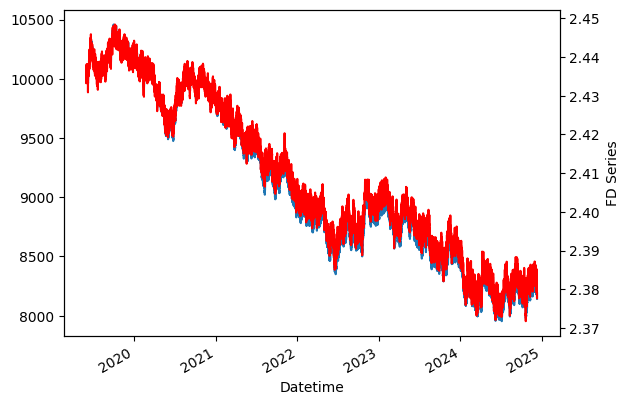

In [ ]:
comb_df['Original'].plot()
ax = comb_df['Fdseries'].plot(secondary_y=True, color='r')
ax.set_ylabel('FD Series')
plt.show()

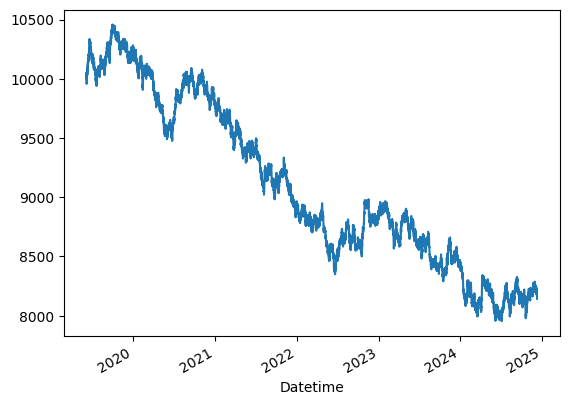

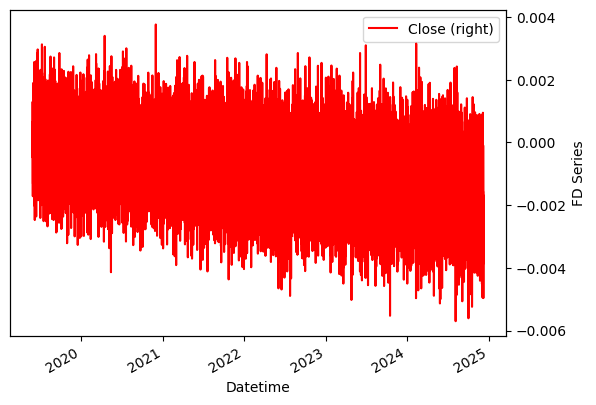

In [ ]:
# @title log returns cum frac diff
comb_df['Original'].plot()
ax = fd_series.plot(secondary_y=True, color='r')
ax.set_ylabel('FD Series')
plt.show()

In [ ]:
adf_test(frac_diff_series.Close)

ADF Statistic:  -2.875167261603428
P-Value:  0.04831285116328258
Critical Values:
	1%: -3.43
	5%: -2.86
	10%: -2.57


<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 2388 entries, 2019-05-30 17:18:22 to 2024-12-08 04:11:44.120000
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Close   2388 non-null   float64
dtypes: float64(1)
memory usage: 37.3 KB


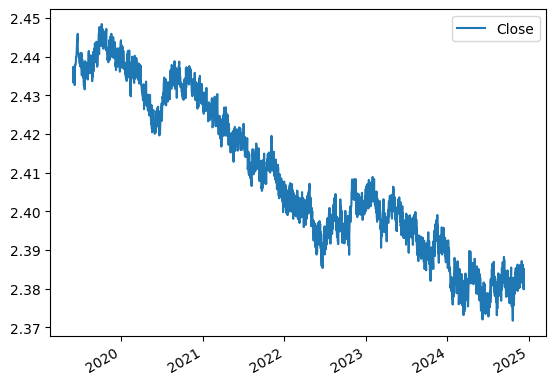

In [ ]:
features = frac_diff_series.loc[triple_barrier_events.index]
features.plot()
features.info()

## Training, Validation and Testing datasets

### Sample Weight: Return Attribution MLFinlab


In the previous section we learned a method to bootstrap samples closer to IID. In this section we will introduce a method to weight those samples for the purpose of training an ML algorithm. Highly overlapping outcomes would have disproportionate weights if considered equal to non-overlapping outcomes. At the same time, labels associated with large absolute returns should be given more importance than labels with negligible absolute returns. In short, we need to weight observations by some function of both uniqueness and absolute return.

When labels are a function of the return sign ({−1,1} for standard labeling or {0, 1} for meta-labeling), the sample weights can be defined in terms of the sum of the attributed returns over the event’s lifespan, [ ti,0,ti,1] ,

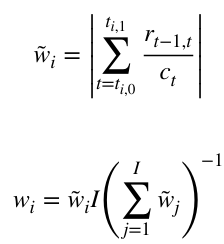

La razón de ser de este método es que deseamos ponderar una observación como una función de los rendimientos logarítmicos absolutos que se le pueden atribuir de manera única. Sin embargo, este método no funcionará si hay un caso "neutral" (retorno por debajo del umbral). En ese caso, a los rendimientos más bajos se les deben asignar pesos más altos, no los recíprocos. El caso "neutral" es innecesario, ya que puede estar implícito en una predicción "-1" o "1" con baja confianza. Esta es una de las varias razones por las que generalmente le aconsejo que abandone los casos "neutrales".

In [ ]:
return_based_sample_weights = attribution.get_weights_by_return(triple_barrier_events, tick_bars.Close, num_threads=5, verbose=True)
return_based_sample_weights

2025-01-07 20:34:08.829579 100.0% num_concurrent_events done after 0.12 minutes. Remaining 0.0 minutes.
C:\Users\angel\AppData\Local\Programs\Python\Python311\Lib\site-packages\mlfinlab\util\multiprocess.py:137: FutureWarning:

The behavior of array concatenation with empty entries is deprecated. In a future version, this will no longer exclude empty items when determining the result dtype. To retain the old behavior, exclude the empty entries before the concat operation.

2025-01-07 20:34:15.128470 100.0% _apply_weight_by_return done after 0.09 minutes. Remaining 0.0 minutes.
C:\Users\angel\AppData\Local\Programs\Python\Python311\Lib\site-packages\mlfinlab\util\multiprocess.py:137: FutureWarning:

The behavior of array concatenation with empty entries is deprecated. In a future version, this will no longer exclude empty items when determining the result dtype. To retain the old behavior, exclude the empty entries before the concat operation.



2019-05-30 17:18:22.000    0.822054
2019-05-31 09:48:22.000    1.525071
2019-06-01 05:03:22.000    1.056288
2019-06-02 08:33:22.000    1.169680
2019-06-05 05:18:22.000    0.221929
                             ...   
2024-12-05 23:56:51.192    1.058961
2024-12-06 16:26:51.184    0.510649
2024-12-07 00:41:51.114    1.523236
2024-12-07 11:41:51.118    1.323080
2024-12-08 04:11:44.120    2.658789
Length: 2388, dtype: float64

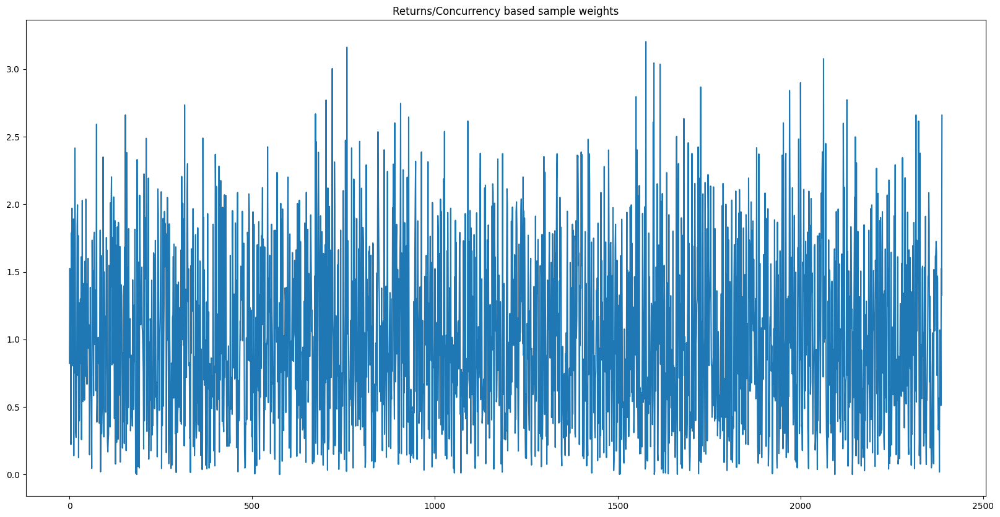

In [ ]:
plt.figure(figsize=(20,10))
plt.title('Returns/Concurrency based sample weights')
return_based_sample_weights.reset_index()[0].plot()
plt.show()

### Thecnical indicators

In [ ]:
raw_data = tick_bars.copy()
raw_data

,Open,High,Low,Close
Datetime,,,,
2019-05-28 10:18:22.000,10040.1,10048.0,10033.1,10044.8
2019-05-28 13:03:22.000,10044.7,10046.8,10026.4,10031.2
2019-05-28 15:48:22.000,10031.1,10035.4,10015.1,10034.6
2019-05-28 18:33:22.000,10034.7,10035.5,10021.8,10029.8
2019-05-28 21:18:22.000,10029.7,10034.0,10021.6,10034.0
...,...,...,...,...
2024-12-08 09:41:44.130,8196.2,8197.7,8180.8,8186.7
2024-12-08 12:26:44.131,8186.6,8189.9,8159.9,8159.9
2024-12-08 15:11:44.129,8159.8,8167.5,8144.9,8145.3


In [ ]:
# Log Returns
raw_data['log_ret'] = np.log(raw_data['Close']).diff()

# Momentum
raw_data['mom1'] = raw_data['Close'].pct_change(periods=1)
raw_data['mom2'] = raw_data['Close'].pct_change(periods=2)
raw_data['mom3'] = raw_data['Close'].pct_change(periods=3)
raw_data['mom4'] = raw_data['Close'].pct_change(periods=4)
raw_data['mom5'] = raw_data['Close'].pct_change(periods=5)

# Volatility
raw_data['volatility_50'] = raw_data['log_ret'].rolling(window=50, min_periods=50, center=False).std()
raw_data['volatility_31'] = raw_data['log_ret'].rolling(window=31, min_periods=31, center=False).std()
raw_data['volatility_15'] = raw_data['log_ret'].rolling(window=15, min_periods=15, center=False).std()

# Serial Correlation (Takes about 4 minutes)
window_autocorr = 50

raw_data['autocorr_1'] = raw_data['log_ret'].rolling(window=window_autocorr, min_periods=window_autocorr, center=False).apply(lambda x: x.autocorr(lag=1), raw=False)
raw_data['autocorr_2'] = raw_data['log_ret'].rolling(window=window_autocorr, min_periods=window_autocorr, center=False).apply(lambda x: x.autocorr(lag=2), raw=False)
raw_data['autocorr_3'] = raw_data['log_ret'].rolling(window=window_autocorr, min_periods=window_autocorr, center=False).apply(lambda x: x.autocorr(lag=3), raw=False)
raw_data['autocorr_4'] = raw_data['log_ret'].rolling(window=window_autocorr, min_periods=window_autocorr, center=False).apply(lambda x: x.autocorr(lag=4), raw=False)
raw_data['autocorr_5'] = raw_data['log_ret'].rolling(window=window_autocorr, min_periods=window_autocorr, center=False).apply(lambda x: x.autocorr(lag=5), raw=False)

# Get the various log -t returns
raw_data['log_t1'] = raw_data['log_ret'].shift(1)
raw_data['log_t2'] = raw_data['log_ret'].shift(2)
raw_data['log_t3'] = raw_data['log_ret'].shift(3)
raw_data['log_t4'] = raw_data['log_ret'].shift(4)
raw_data['log_t5'] = raw_data['log_ret'].shift(5)

In [ ]:
raw_data

,Open,High,Low,Close,log_ret,mom1,mom2,mom3,mom4,mom5,...,autocorr_1,autocorr_2,autocorr_3,autocorr_4,autocorr_5,log_t1,log_t2,log_t3,log_t4,log_t5
Datetime,,,,,,,,,,,,,,,,,,,,,
2019-05-28 10:18:22.000,10040.1,10048.0,10033.1,10044.8,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2019-05-28 13:03:22.000,10044.7,10046.8,10026.4,10031.2,-0.001355,-0.001354,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2019-05-28 15:48:22.000,10031.1,10035.4,10015.1,10034.6,0.000339,0.000339,-0.001015,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,-0.001355,NaN,NaN,NaN,NaN
2019-05-28 18:33:22.000,10034.7,10035.5,10021.8,10029.8,-0.000478,-0.000478,-0.000140,-0.001493,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,0.000339,-0.001355,NaN,NaN,NaN
2019-05-28 21:18:22.000,10029.7,10034.0,10021.6,10034.0,0.000419,0.000419,-0.000060,0.000279,-0.001075,NaN,...,NaN,NaN,NaN,NaN,NaN,-0.000478,0.000339,-0.001355,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-12-08 09:41:44.130,8196.2,8197.7,8180.8,8186.7,-0.001148,-0.001147,-0.002267,-0.001695,-0.001476,-0.001135,...,0.249149,-0.058799,-0.173782,-0.226686,-0.128717,-0.001122,0.000573,0.000220,0.000342,0.000366
2024-12-08 12:26:44.131,8186.6,8189.9,8159.9,8159.9,-0.003279,-0.003274,-0.004417,-0.005533,-0.004963,-0.004745,...,0.273274,-0.013522,-0.190846,-0.231367,-0.159473,-0.001148,-0.001122,0.000573,0.000220,0.000342
2024-12-08 15:11:44.129,8159.8,8167.5,8144.9,8145.3,-0.001791,-0.001789,-0.005057,-0.006198,-0.007312,-0.006743,...,0.310975,0.005695,-0.169952,-0.257629,-0.163327,-0.003279,-0.001148,-0.001122,0.000573,0.000220


Combinación de la diferenciación fraccionaria con las nuevas features.

In [ ]:
# Crear el nuevo dataset combinando los dos datasets con un merge basado en el índice
X = features.merge(raw_data, how='inner', left_index=True, right_index=True)

# Imprimir información del dataset resultante
X.dropna(inplace=True)

X

,Close_x,Open,High,Low,Close_y,log_ret,mom1,mom2,mom3,mom4,...,autocorr_1,autocorr_2,autocorr_3,autocorr_4,autocorr_5,log_t1,log_t2,log_t3,log_t4,log_t5
2019-06-05 05:18:22.000,2.436546,10015.9,10030.3,10013.5,10029.4,0.001357,0.001358,0.001658,0.000579,0.000080,...,-0.144584,0.030668,0.026677,-0.080864,0.259690,0.000300,-0.001078,-0.000499,0.000219,0.000399
2019-06-06 14:18:22.000,2.433501,10025.3,10027.5,10004.0,10005.4,-0.001977,-0.001975,-0.002194,-0.001477,-0.001796,...,-0.138158,0.048502,-0.167479,0.080366,0.011473,-0.000219,0.000718,-0.000319,-0.000080,-0.000020
2019-06-07 12:18:22.000,2.432621,9998.3,9999.7,9975.3,9981.4,-0.001682,-0.001680,-0.002139,-0.002777,-0.003116,...,-0.122189,0.041228,-0.166457,-0.022718,-0.007417,-0.000460,-0.000640,-0.000340,-0.000020,0.001099
2019-06-08 04:48:22.000,2.435563,9979.5,9993.5,9978.2,9992.0,0.001262,0.001263,0.002488,0.002287,0.002669,...,-0.089907,-0.017815,-0.074152,-0.037296,-0.154145,0.001223,-0.000201,0.000381,0.000863,-0.002468
2019-06-08 21:18:22.000,2.437880,10018.3,10038.7,10015.4,10037.6,0.001935,0.001936,0.002217,0.001916,0.002837,...,0.012455,0.125838,-0.021754,-0.053833,-0.038834,0.000280,-0.000299,0.000919,0.000180,0.001540
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-12-05 23:56:51.192,2.383434,8194.9,8206.7,8189.7,8206.6,0.001439,0.001440,0.002370,0.003080,0.002663,...,0.232095,0.038135,-0.191821,-0.316566,-0.116076,0.000928,0.000709,-0.000415,-0.002099,-0.002873
2024-12-06 16:26:51.184,2.385220,8221.3,8238.0,8220.3,8232.2,0.001313,0.001314,0.003951,0.003315,0.002362,...,0.241359,0.004254,-0.179305,-0.310584,-0.109369,0.002631,-0.000634,-0.000950,0.000560,0.000195
2024-12-07 00:41:51.114,2.382159,8209.1,8216.1,8204.0,8206.8,-0.000292,-0.000292,-0.001241,-0.003085,-0.001776,...,0.193231,-0.067416,-0.187110,-0.255396,-0.070349,-0.000950,-0.001848,0.001313,0.002631,-0.000634
2024-12-07 11:41:51.118,2.379852,8185.9,8193.5,8172.6,8177.0,-0.001100,-0.001099,-0.003291,-0.003753,-0.003631,...,0.213043,-0.041048,-0.178918,-0.274100,-0.055891,-0.002196,-0.000463,0.000122,-0.000292,-0.000950


Elimnar columnas que no quieran ser utilizadas

In [ ]:
X.drop(['Open', 'High', 'Low', 'Close_y'], axis=1, inplace=True)
X

,Close_x,log_ret,mom1,mom2,mom3,mom4,mom5,volatility_50,volatility_31,volatility_15,autocorr_1,autocorr_2,autocorr_3,autocorr_4,autocorr_5,log_t1,log_t2,log_t3,log_t4,log_t5
2019-06-05 05:18:22.000,2.436546,0.001357,0.001358,0.001658,0.000579,0.000080,0.000299,0.000931,0.000860,0.000797,-0.144584,0.030668,0.026677,-0.080864,0.259690,0.000300,-0.001078,-0.000499,0.000219,0.000399
2019-06-06 14:18:22.000,2.433501,-0.001977,-0.001975,-0.002194,-0.001477,-0.001796,-0.001875,0.000955,0.000977,0.001156,-0.138158,0.048502,-0.167479,0.080366,0.011473,-0.000219,0.000718,-0.000319,-0.000080,-0.000020
2019-06-07 12:18:22.000,2.432621,-0.001682,-0.001680,-0.002139,-0.002777,-0.003116,-0.003136,0.000936,0.000980,0.000813,-0.122189,0.041228,-0.166457,-0.022718,-0.007417,-0.000460,-0.000640,-0.000340,-0.000020,0.001099
2019-06-08 04:48:22.000,2.435563,0.001262,0.001263,0.002488,0.002287,0.002669,0.003535,0.001003,0.001079,0.001173,-0.089907,-0.017815,-0.074152,-0.037296,-0.154145,0.001223,-0.000201,0.000381,0.000863,-0.002468
2019-06-08 21:18:22.000,2.437880,0.001935,0.001936,0.002217,0.001916,0.002837,0.003018,0.001000,0.001136,0.001201,0.012455,0.125838,-0.021754,-0.053833,-0.038834,0.000280,-0.000299,0.000919,0.000180,0.001540
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-12-05 23:56:51.192,2.383434,0.001439,0.001440,0.002370,0.003080,0.002663,0.000561,0.001305,0.001362,0.001609,0.232095,0.038135,-0.191821,-0.316566,-0.116076,0.000928,0.000709,-0.000415,-0.002099,-0.002873
2024-12-06 16:26:51.184,2.385220,0.001313,0.001314,0.003951,0.003315,0.002362,0.002924,0.001366,0.001436,0.001455,0.241359,0.004254,-0.179305,-0.310584,-0.109369,0.002631,-0.000634,-0.000950,0.000560,0.000195
2024-12-07 00:41:51.114,2.382159,-0.000292,-0.000292,-0.001241,-0.003085,-0.001776,0.000854,0.001340,0.001389,0.001479,0.193231,-0.067416,-0.187110,-0.255396,-0.070349,-0.000950,-0.001848,0.001313,0.002631,-0.000634
2024-12-07 11:41:51.118,2.379852,-0.001100,-0.001099,-0.003291,-0.003753,-0.003631,-0.003922,0.001366,0.001417,0.001304,0.213043,-0.041048,-0.178918,-0.274100,-0.055891,-0.002196,-0.000463,0.000122,-0.000292,-0.000950


Creación del dataset de variable objetivo

In [ ]:
y = labels.loc[X.index]['bin']
y

2019-06-05 05:18:22.000   -1.0
2019-06-06 14:18:22.000   -1.0
2019-06-07 12:18:22.000   -1.0
2019-06-08 04:48:22.000    1.0
2019-06-08 21:18:22.000    1.0
                          ... 
2024-12-05 23:56:51.192    1.0
2024-12-06 16:26:51.184   -1.0
2024-12-07 00:41:51.114   -1.0
2024-12-07 11:41:51.118    1.0
2024-12-08 04:11:44.120   -1.0
Name: bin, Length: 2384, dtype: float64

### Time Decay

In [ ]:
time_based_sample_weights = attribution.get_weights_by_time_decay(triple_barrier_events, tick_bars.Close, decay=0.5)

2025-01-07 20:34:58.005100 100.0% num_concurrent_events done after 0.1 minutes. Remaining 0.0 minutes.
C:\Users\angel\AppData\Local\Programs\Python\Python311\Lib\site-packages\mlfinlab\util\multiprocess.py:137: FutureWarning:

The behavior of array concatenation with empty entries is deprecated. In a future version, this will no longer exclude empty items when determining the result dtype. To retain the old behavior, exclude the empty entries before the concat operation.

2025-01-07 20:35:04.783698 100.0% _get_average_uniqueness done after 0.1 minutes. Remaining 0.0 minutes.
C:\Users\angel\AppData\Local\Programs\Python\Python311\Lib\site-packages\mlfinlab\util\multiprocess.py:137: FutureWarning:

The behavior of array concatenation with empty entries is deprecated. In a future version, this will no longer exclude empty items when determining the result dtype. To retain the old behavior, exclude the empty entries before the concat operation.



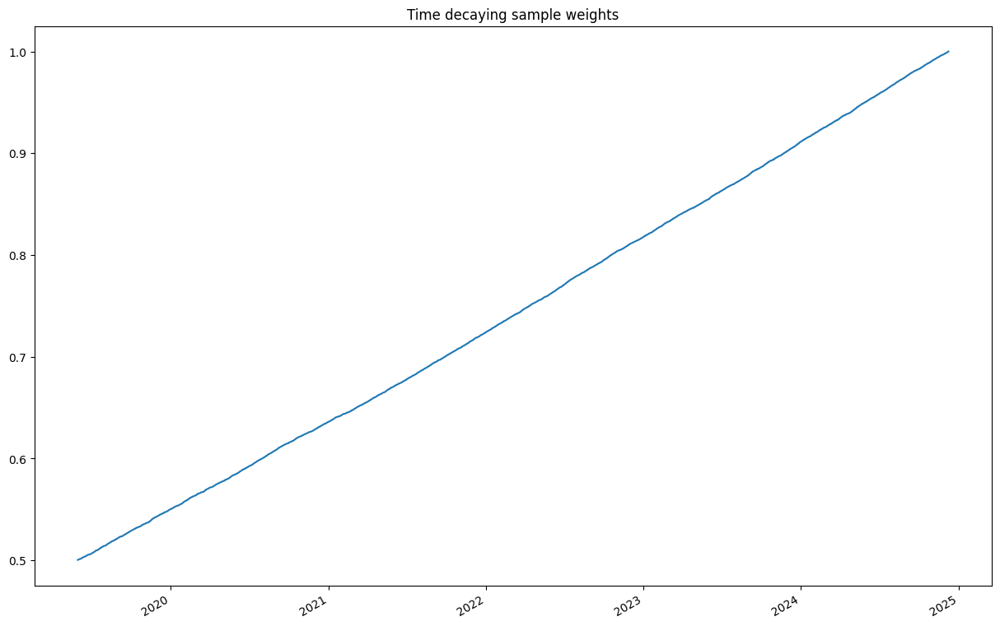

In [ ]:
plt.figure(figsize=(15, 10))
plt.title('Time decaying sample weights')
time_based_sample_weights.plot()
plt.show()

### Data split

In [ ]:
# Split data into training, validation and test sets
X_train, X_validate, y_train, y_validate = train_test_split(X, y, test_size=0.15, shuffle=False)

In [ ]:
X_train = X
y_train = y

In [ ]:
X_train.shape, X_validate.shape, y_train.shape, y_validate.shape

((806, 20), (143, 20), (806,), (143,))

In [ ]:
y_train.value_counts()

bin
-1.0    404
 1.0    402
Name: count, dtype: int64

## Cross Validation

In [ ]:
parameters = {'max_depth':[2, 3, 4, 5, 7],
              'n_estimators':[10, 25, 50, 100, 256, 512]}

In [ ]:
cv_gen_purged = cross_validation.PurgedKFold(n_splits=4,
                                             samples_info_sets=triple_barrier_events.loc[X_train.index].t1)

In [ ]:
clf_base = DecisionTreeClassifier(criterion='entropy', random_state=42,
                                              max_depth=2, class_weight='balanced')
clf = RandomForestClassifier(n_estimators=10,
                                             max_depth=2,
                                             random_state=42,
                                             n_jobs=-1,
                                             oob_score=False,
                                            criterion='entropy',
                                            class_weight='balanced_subsample',
                                            max_features=1.)

# temp_score_base = cross_validation.ml_cross_val_score(clf, X_train, y_train, cv_gen_purged,
#                                                                     sample_weight_train=return_based_sample_weights.loc[X_train.index].values)

sample_weight_train=return_based_sample_weights.loc[X_train.index].values

# If no sample_weight then broadcast a value of 1 to all samples (full weight).
if sample_weight_train is None:
    sample_weight_train = np.ones((X_train.shape[0],))

sample_weight_score = np.ones((X_train.shape[0],))

# scoring: Callable[[np.array, np.array], float] = log_loss
scoring: Callable[[np.array, np.array], float] = accuracy_score

# Score model on KFolds
ret_scores = []

samples_info_sets=boot_barrier_events.loc[X_train.index].t1

embargo = 1

indices: np.ndarray = np.arange(X_train.shape[0])

test_ranges: [(int, int)] = [(ix[0], ix[-1] + 1) for ix in np.array_split(np.arange(X_train.shape[0]), 4)]

for start_ix, end_ix in test_ranges:
    test_indices = indices[start_ix:end_ix]

    # Add embargo multiple to extend test times (not test indices) which will
    # affect train times and not actual test indices
    delta = samples_info_sets[0] - samples_info_sets.index[0]
    end = samples_info_sets.iloc[end_ix-1] + (delta * embargo)

    test_times = pd.Series(index=[samples_info_sets.index[start_ix]], data=[end])
    train_times = ml_get_train_times(samples_info_sets, test_times)

    train_indices = []
    for train_ix in train_times.index.unique():
        loc = samples_info_sets.index.get_loc(train_ix)
        if not isinstance(loc, int):
            loc = np.arange(loc.start, loc.stop)
        train_indices.append(loc)

    # train_indices = np.concatenate(train_indices)

    # # Sanity check (no overlap)
    if len(np.intersect1d(train_indices,test_indices)) > 0:
        raise Exception("Train and test intersect")

    fit = clf.fit(X=X_train.iloc[train_indices, :], y=y_train.iloc[train_indices], sample_weight=sample_weight_train[train_indices])
    if scoring == log_loss:
        prob = fit.predict_proba(X_train.iloc[test_indices, :])
        score = -1 * scoring(y_train.iloc[test_indices], prob, sample_weight=sample_weight_score[test_indices], labels=clf.classes_)
    else:
        pred = fit.predict(X_train.iloc[test_indices, :])
        score = scoring(y_train.iloc[test_indices], pred, sample_weight=sample_weight_score[test_indices])
    ret_scores.append(score)

    print(score)
print(ret_scores)

    # yield train_indices, test_indices

# for train, test in cv_gen_purged.split(X=X_train, y=y_train):
    # fit = clf.fit(X=X_train.iloc[train, :], y=y_train.iloc[train], sample_weight=sample_weight_train[train])
    # if scoring == log_loss:
    #     prob = fit.predict_proba(X_train.iloc[test, :])
    #     score = -1 * scoring(y_train.iloc[test], prob, sample_weight=sample_weight_score[test], labels=clf.classes_)
    # else:
    #     pred = fit.predict(X_train.iloc[test, :])
    #     score = scoring(y_train.iloc[test], pred, sample_weight=sample_weight_score[test])
    # ret_scores.append(score)

# ret_scores
# return np.array(ret_scores)

C:\Users\angel\AppData\Local\Temp\ipykernel_27460\2266932743.py:42: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`



NameError: name 'ml_get_train_times' is not defined

In [ ]:
def perform_grid_search_sample_weights(X_data, y_data, cv_gen, parameters, sample_weight_train, clftype='standard'):
    """
    Grid search using Purged CV using sample weights in fit(). Returns top model and top score
    """
    max_cross_val_score = -np.inf
    top_model = None
    for m_depth in parameters['max_depth']:
        for n_est in parameters['n_estimators']:
            clf_base = DecisionTreeClassifier(criterion='entropy', random_state=42,
                                              max_depth=m_depth, class_weight='balanced')
            if clftype == 'standard':
                clf = BaggingClassifier(n_estimators=n_est,
                                        estimator=clf_base,
                                        random_state=42, n_jobs=-1,
                                        oob_score=False, max_features=1.)
            elif clftype == 'random_forest':
                clf = RandomForestClassifier(n_estimators=n_est,
                                             max_depth=m_depth,
                                             random_state=42,
                                             n_jobs=-1,
                                             oob_score=False,
                                            criterion='entropy',
                                            class_weight='balanced_subsample',
                                            max_features=1.)
            # elif clftype == 'sequential_bootstrapping':
            #     clf = SequentiallyBootstrappedBaggingClassifier(samples_info_sets=boot_barrier_events.loc[X_train.index].t1,
            #                                                     price_bars = data.loc[X_train.index.min():X_train.index.max(), 'close'],
            #                                                     n_estimators=n_est, base_estimator=clf_base,
            #                                                     random_state=42, n_jobs=-1, oob_score=False,
            #                                                     max_features=1.)
            temp_score_base = cross_validation.ml_cross_val_score(clf, X_train, y_train, cv_gen,
                                                                    sample_weight_train=sample_weight_train)
            if temp_score_base.mean() > max_cross_val_score:
                max_cross_val_score = temp_score_base.mean()
                print(temp_score_base.mean())
                top_model = clf
    return top_model, max_cross_val_score

In [ ]:
def perform_grid_search(X_data, y_data, cv_gen, parameters, clftype='standard'):
    """
    Grid search using Purged CV without using sample weights in fit(). Returns top model and top score
    """
    max_cross_val_score = -np.inf
    top_model = None
    for m_depth in parameters['max_depth']:
        for n_est in parameters['n_estimators']:
            clf_base = DecisionTreeClassifier(criterion='entropy', random_state=42,
                                              max_depth=m_depth, class_weight='balanced')
            if clftype == 'standard':
                clf = BaggingClassifier(n_estimators=n_est,
                                        estimator=clf_base,
                                        random_state=42, n_jobs=-1,
                                        oob_score=False, max_features=1.)
            elif clftype == 'random_forest':
                clf = RandomForestClassifier(n_estimators=n_est,
                                             max_depth=m_depth,
                                             random_state=42,
                                             n_jobs=-1,
                                             oob_score=False,
                                            criterion='entropy',
                                            class_weight='balanced_subsample',
                                            max_features=1.)
            # elif clftype == 'sequential_bootstrapping':
            #     clf = SequentiallyBootstrappedBaggingClassifier(samples_info_sets=triple_barrier_events.loc[X_train.index].t1,
            #                                                     price_bars = data.loc[X_train.index.min():X_train.index.max(), 'close'],
            #                                                     n_estimators=n_est, base_estimator=clf_base,
            #                                                     random_state=42, n_jobs=-1, oob_score=False,
            #                                                     max_features=1.)
            temp_score_base = cross_validation.ml_cross_val_score(clf, X_train, y_train, cv_gen)
            if temp_score_base.mean() > max_cross_val_score:
                max_cross_val_score = temp_score_base.mean()
                print(temp_score_base.mean())
                top_model = clf
    return top_model, max_cross_val_score

In [ ]:
top_model, cross_val_score = perform_grid_search_sample_weights(X_train, y_train, cv_gen=cv_gen_purged, parameters=parameters, sample_weight_train=return_based_sample_weights.loc[X_train.index].values,  clftype='standard')

C:\Users\angel\AppData\Local\Programs\Python\Python311\Lib\site-packages\mlfinlab\cross_validation\cross_validation.py:93: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

C:\Users\angel\AppData\Local\Programs\Python\Python311\Lib\site-packages\mlfinlab\cross_validation\cross_validation.py:93: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

C:\Users\angel\AppData\Local\Programs\Python\Python311\Lib\site-packages\mlfinlab\cross_validation\cross_validation.py:93: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with Da

-0.7848570589065154


C:\Users\angel\AppData\Local\Programs\Python\Python311\Lib\site-packages\mlfinlab\cross_validation\cross_validation.py:93: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

C:\Users\angel\AppData\Local\Programs\Python\Python311\Lib\site-packages\mlfinlab\cross_validation\cross_validation.py:93: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

C:\Users\angel\AppData\Local\Programs\Python\Python311\Lib\site-packages\mlfinlab\cross_validation\cross_validation.py:93: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with Da

-0.7836361277881965


C:\Users\angel\AppData\Local\Programs\Python\Python311\Lib\site-packages\mlfinlab\cross_validation\cross_validation.py:93: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

C:\Users\angel\AppData\Local\Programs\Python\Python311\Lib\site-packages\mlfinlab\cross_validation\cross_validation.py:93: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

C:\Users\angel\AppData\Local\Programs\Python\Python311\Lib\site-packages\mlfinlab\cross_validation\cross_validation.py:93: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with Da

-0.7830850805305448


C:\Users\angel\AppData\Local\Programs\Python\Python311\Lib\site-packages\mlfinlab\cross_validation\cross_validation.py:93: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

C:\Users\angel\AppData\Local\Programs\Python\Python311\Lib\site-packages\mlfinlab\cross_validation\cross_validation.py:93: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

C:\Users\angel\AppData\Local\Programs\Python\Python311\Lib\site-packages\mlfinlab\cross_validation\cross_validation.py:93: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with Da

-0.7828374567860878


C:\Users\angel\AppData\Local\Programs\Python\Python311\Lib\site-packages\mlfinlab\cross_validation\cross_validation.py:93: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

C:\Users\angel\AppData\Local\Programs\Python\Python311\Lib\site-packages\mlfinlab\cross_validation\cross_validation.py:93: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

C:\Users\angel\AppData\Local\Programs\Python\Python311\Lib\site-packages\mlfinlab\cross_validation\cross_validation.py:93: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with Da

-0.7825111762468029


C:\Users\angel\AppData\Local\Programs\Python\Python311\Lib\site-packages\mlfinlab\cross_validation\cross_validation.py:93: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

C:\Users\angel\AppData\Local\Programs\Python\Python311\Lib\site-packages\mlfinlab\cross_validation\cross_validation.py:93: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

C:\Users\angel\AppData\Local\Programs\Python\Python311\Lib\site-packages\mlfinlab\cross_validation\cross_validation.py:93: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with Da

-0.7820539585057932


C:\Users\angel\AppData\Local\Programs\Python\Python311\Lib\site-packages\mlfinlab\cross_validation\cross_validation.py:93: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

C:\Users\angel\AppData\Local\Programs\Python\Python311\Lib\site-packages\mlfinlab\cross_validation\cross_validation.py:93: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

C:\Users\angel\AppData\Local\Programs\Python\Python311\Lib\site-packages\mlfinlab\cross_validation\cross_validation.py:93: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with Da

-0.7790713850611029


C:\Users\angel\AppData\Local\Programs\Python\Python311\Lib\site-packages\mlfinlab\cross_validation\cross_validation.py:93: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

C:\Users\angel\AppData\Local\Programs\Python\Python311\Lib\site-packages\mlfinlab\cross_validation\cross_validation.py:93: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

C:\Users\angel\AppData\Local\Programs\Python\Python311\Lib\site-packages\mlfinlab\cross_validation\cross_validation.py:93: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with Da

-0.7785347350999002


C:\Users\angel\AppData\Local\Programs\Python\Python311\Lib\site-packages\mlfinlab\cross_validation\cross_validation.py:93: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

C:\Users\angel\AppData\Local\Programs\Python\Python311\Lib\site-packages\mlfinlab\cross_validation\cross_validation.py:93: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

C:\Users\angel\AppData\Local\Programs\Python\Python311\Lib\site-packages\mlfinlab\cross_validation\cross_validation.py:93: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with Da

-0.7779326624694786


C:\Users\angel\AppData\Local\Programs\Python\Python311\Lib\site-packages\mlfinlab\cross_validation\cross_validation.py:93: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

C:\Users\angel\AppData\Local\Programs\Python\Python311\Lib\site-packages\mlfinlab\cross_validation\cross_validation.py:93: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

C:\Users\angel\AppData\Local\Programs\Python\Python311\Lib\site-packages\mlfinlab\cross_validation\cross_validation.py:93: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with Da

-0.777522026529941


C:\Users\angel\AppData\Local\Programs\Python\Python311\Lib\site-packages\mlfinlab\cross_validation\cross_validation.py:93: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

C:\Users\angel\AppData\Local\Programs\Python\Python311\Lib\site-packages\mlfinlab\cross_validation\cross_validation.py:93: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

C:\Users\angel\AppData\Local\Programs\Python\Python311\Lib\site-packages\mlfinlab\cross_validation\cross_validation.py:93: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with Da

-0.7756947946171238


C:\Users\angel\AppData\Local\Programs\Python\Python311\Lib\site-packages\mlfinlab\cross_validation\cross_validation.py:93: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

C:\Users\angel\AppData\Local\Programs\Python\Python311\Lib\site-packages\mlfinlab\cross_validation\cross_validation.py:93: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

C:\Users\angel\AppData\Local\Programs\Python\Python311\Lib\site-packages\mlfinlab\cross_validation\cross_validation.py:93: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with Da

-0.7743613382759572


C:\Users\angel\AppData\Local\Programs\Python\Python311\Lib\site-packages\mlfinlab\cross_validation\cross_validation.py:93: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

C:\Users\angel\AppData\Local\Programs\Python\Python311\Lib\site-packages\mlfinlab\cross_validation\cross_validation.py:93: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

C:\Users\angel\AppData\Local\Programs\Python\Python311\Lib\site-packages\mlfinlab\cross_validation\cross_validation.py:93: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with Da

-0.7734225542030223


C:\Users\angel\AppData\Local\Programs\Python\Python311\Lib\site-packages\mlfinlab\cross_validation\cross_validation.py:93: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

C:\Users\angel\AppData\Local\Programs\Python\Python311\Lib\site-packages\mlfinlab\cross_validation\cross_validation.py:93: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

C:\Users\angel\AppData\Local\Programs\Python\Python311\Lib\site-packages\mlfinlab\cross_validation\cross_validation.py:93: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with Da

-0.7717923601260875


C:\Users\angel\AppData\Local\Programs\Python\Python311\Lib\site-packages\mlfinlab\cross_validation\cross_validation.py:93: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

C:\Users\angel\AppData\Local\Programs\Python\Python311\Lib\site-packages\mlfinlab\cross_validation\cross_validation.py:93: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

C:\Users\angel\AppData\Local\Programs\Python\Python311\Lib\site-packages\mlfinlab\cross_validation\cross_validation.py:93: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with Da

-0.771740151486852


C:\Users\angel\AppData\Local\Programs\Python\Python311\Lib\site-packages\mlfinlab\cross_validation\cross_validation.py:93: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

C:\Users\angel\AppData\Local\Programs\Python\Python311\Lib\site-packages\mlfinlab\cross_validation\cross_validation.py:93: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

C:\Users\angel\AppData\Local\Programs\Python\Python311\Lib\site-packages\mlfinlab\cross_validation\cross_validation.py:93: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with Da

-0.7663185306118181


C:\Users\angel\AppData\Local\Programs\Python\Python311\Lib\site-packages\mlfinlab\cross_validation\cross_validation.py:93: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

C:\Users\angel\AppData\Local\Programs\Python\Python311\Lib\site-packages\mlfinlab\cross_validation\cross_validation.py:93: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

C:\Users\angel\AppData\Local\Programs\Python\Python311\Lib\site-packages\mlfinlab\cross_validation\cross_validation.py:93: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with Da

-0.7656352158470561


C:\Users\angel\AppData\Local\Programs\Python\Python311\Lib\site-packages\mlfinlab\cross_validation\cross_validation.py:93: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

C:\Users\angel\AppData\Local\Programs\Python\Python311\Lib\site-packages\mlfinlab\cross_validation\cross_validation.py:93: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

C:\Users\angel\AppData\Local\Programs\Python\Python311\Lib\site-packages\mlfinlab\cross_validation\cross_validation.py:93: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with Da

-0.7641003078606705


C:\Users\angel\AppData\Local\Programs\Python\Python311\Lib\site-packages\mlfinlab\cross_validation\cross_validation.py:93: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

C:\Users\angel\AppData\Local\Programs\Python\Python311\Lib\site-packages\mlfinlab\cross_validation\cross_validation.py:93: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

C:\Users\angel\AppData\Local\Programs\Python\Python311\Lib\site-packages\mlfinlab\cross_validation\cross_validation.py:93: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with Da

-0.7634175406103041


C:\Users\angel\AppData\Local\Programs\Python\Python311\Lib\site-packages\mlfinlab\cross_validation\cross_validation.py:93: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

C:\Users\angel\AppData\Local\Programs\Python\Python311\Lib\site-packages\mlfinlab\cross_validation\cross_validation.py:93: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

C:\Users\angel\AppData\Local\Programs\Python\Python311\Lib\site-packages\mlfinlab\cross_validation\cross_validation.py:93: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with Da

-0.7593037249304782


C:\Users\angel\AppData\Local\Programs\Python\Python311\Lib\site-packages\mlfinlab\cross_validation\cross_validation.py:93: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

C:\Users\angel\AppData\Local\Programs\Python\Python311\Lib\site-packages\mlfinlab\cross_validation\cross_validation.py:93: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

C:\Users\angel\AppData\Local\Programs\Python\Python311\Lib\site-packages\mlfinlab\cross_validation\cross_validation.py:93: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with Da

-0.7471135574323171


C:\Users\angel\AppData\Local\Programs\Python\Python311\Lib\site-packages\mlfinlab\cross_validation\cross_validation.py:93: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

C:\Users\angel\AppData\Local\Programs\Python\Python311\Lib\site-packages\mlfinlab\cross_validation\cross_validation.py:93: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

C:\Users\angel\AppData\Local\Programs\Python\Python311\Lib\site-packages\mlfinlab\cross_validation\cross_validation.py:93: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with Da

-0.7458599644504957


C:\Users\angel\AppData\Local\Programs\Python\Python311\Lib\site-packages\mlfinlab\cross_validation\cross_validation.py:93: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

C:\Users\angel\AppData\Local\Programs\Python\Python311\Lib\site-packages\mlfinlab\cross_validation\cross_validation.py:93: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

C:\Users\angel\AppData\Local\Programs\Python\Python311\Lib\site-packages\mlfinlab\cross_validation\cross_validation.py:93: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with Da

-0.7456234451513388


C:\Users\angel\AppData\Local\Programs\Python\Python311\Lib\site-packages\mlfinlab\cross_validation\cross_validation.py:93: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

C:\Users\angel\AppData\Local\Programs\Python\Python311\Lib\site-packages\mlfinlab\cross_validation\cross_validation.py:93: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

C:\Users\angel\AppData\Local\Programs\Python\Python311\Lib\site-packages\mlfinlab\cross_validation\cross_validation.py:93: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with Da

In [ ]:
top_model

BaggingClassifier(estimator=DecisionTreeClassifier(class_weight='balanced',
                                                   criterion='entropy',
                                                   max_depth=7,
                                                   random_state=42),
                  n_estimators=256, n_jobs=-1, random_state=42)

In [ ]:
cross_val_score

-0.7456234451513388

In [ ]:
top_model2, cross_val_score2 = perform_grid_search(X_train, y_train, cv_gen=cv_gen_purged,parameters=parameters, clftype='standard')

C:\Users\angel\AppData\Local\Programs\Python\Python311\Lib\site-packages\mlfinlab\cross_validation\cross_validation.py:93: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

C:\Users\angel\AppData\Local\Programs\Python\Python311\Lib\site-packages\mlfinlab\cross_validation\cross_validation.py:93: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

C:\Users\angel\AppData\Local\Programs\Python\Python311\Lib\site-packages\mlfinlab\cross_validation\cross_validation.py:93: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with Da

-0.6964786635334895


C:\Users\angel\AppData\Local\Programs\Python\Python311\Lib\site-packages\mlfinlab\cross_validation\cross_validation.py:93: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

C:\Users\angel\AppData\Local\Programs\Python\Python311\Lib\site-packages\mlfinlab\cross_validation\cross_validation.py:93: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

C:\Users\angel\AppData\Local\Programs\Python\Python311\Lib\site-packages\mlfinlab\cross_validation\cross_validation.py:93: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with Da

-0.6956822329727625


C:\Users\angel\AppData\Local\Programs\Python\Python311\Lib\site-packages\mlfinlab\cross_validation\cross_validation.py:93: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

C:\Users\angel\AppData\Local\Programs\Python\Python311\Lib\site-packages\mlfinlab\cross_validation\cross_validation.py:93: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

C:\Users\angel\AppData\Local\Programs\Python\Python311\Lib\site-packages\mlfinlab\cross_validation\cross_validation.py:93: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with Da

-0.6954061739242483


C:\Users\angel\AppData\Local\Programs\Python\Python311\Lib\site-packages\mlfinlab\cross_validation\cross_validation.py:93: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

C:\Users\angel\AppData\Local\Programs\Python\Python311\Lib\site-packages\mlfinlab\cross_validation\cross_validation.py:93: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

C:\Users\angel\AppData\Local\Programs\Python\Python311\Lib\site-packages\mlfinlab\cross_validation\cross_validation.py:93: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with Da

In [ ]:
top_model2

BaggingClassifier(estimator=DecisionTreeClassifier(class_weight='balanced',
                                                   criterion='entropy',
                                                   max_depth=2,
                                                   random_state=42),
                  n_estimators=100, n_jobs=-1, random_state=42)

In [ ]:
cross_val_score2

-0.6954061739242483

In [ ]:
top_model3, cross_val_score3 = perform_grid_search_sample_weights(X_train, y_train, cv_gen=cv_gen_purged, parameters=parameters, sample_weight_train=time_based_sample_weights.loc[X_train.index].values,  clftype='standard')

C:\Users\angel\AppData\Local\Programs\Python\Python311\Lib\site-packages\mlfinlab\cross_validation\cross_validation.py:93: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

C:\Users\angel\AppData\Local\Programs\Python\Python311\Lib\site-packages\mlfinlab\cross_validation\cross_validation.py:93: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

C:\Users\angel\AppData\Local\Programs\Python\Python311\Lib\site-packages\mlfinlab\cross_validation\cross_validation.py:93: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with Da

-0.6967154423696136


C:\Users\angel\AppData\Local\Programs\Python\Python311\Lib\site-packages\mlfinlab\cross_validation\cross_validation.py:93: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

C:\Users\angel\AppData\Local\Programs\Python\Python311\Lib\site-packages\mlfinlab\cross_validation\cross_validation.py:93: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

C:\Users\angel\AppData\Local\Programs\Python\Python311\Lib\site-packages\mlfinlab\cross_validation\cross_validation.py:93: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with Da

-0.6960980661628053


C:\Users\angel\AppData\Local\Programs\Python\Python311\Lib\site-packages\mlfinlab\cross_validation\cross_validation.py:93: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

C:\Users\angel\AppData\Local\Programs\Python\Python311\Lib\site-packages\mlfinlab\cross_validation\cross_validation.py:93: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

C:\Users\angel\AppData\Local\Programs\Python\Python311\Lib\site-packages\mlfinlab\cross_validation\cross_validation.py:93: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with Da

-0.6958011858113675


C:\Users\angel\AppData\Local\Programs\Python\Python311\Lib\site-packages\mlfinlab\cross_validation\cross_validation.py:93: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

C:\Users\angel\AppData\Local\Programs\Python\Python311\Lib\site-packages\mlfinlab\cross_validation\cross_validation.py:93: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

C:\Users\angel\AppData\Local\Programs\Python\Python311\Lib\site-packages\mlfinlab\cross_validation\cross_validation.py:93: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with Da

-0.6957748294168458


C:\Users\angel\AppData\Local\Programs\Python\Python311\Lib\site-packages\mlfinlab\cross_validation\cross_validation.py:93: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

C:\Users\angel\AppData\Local\Programs\Python\Python311\Lib\site-packages\mlfinlab\cross_validation\cross_validation.py:93: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

C:\Users\angel\AppData\Local\Programs\Python\Python311\Lib\site-packages\mlfinlab\cross_validation\cross_validation.py:93: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with Da

In [ ]:
cross_val_score3

-0.6957748294168458

## Feature Importance

### Para mejor modelo con return attribution sample weights

In [ ]:
# MDI, MDA, SFI feature importance
mdi_feat_imp = mean_decrease_impurity(top_model, X_train.columns)
mda_feat_imp = mean_decrease_accuracy(top_model, X_train, y_train, cv_gen_purged,
                                                         sample_weight_train=return_based_sample_weights.loc[X_train.index].values)
sfi_feat_imp = single_feature_importance(top_model, X_train, y_train, cv_gen_purged,
                                     sample_weight_train=return_based_sample_weights.loc[X_train.index].values)

C:\Users\angel\AppData\Local\Programs\Python\Python311\Lib\site-packages\mlfinlab\cross_validation\cross_validation.py:93: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

C:\Users\angel\AppData\Local\Programs\Python\Python311\Lib\site-packages\mlfinlab\cross_validation\cross_validation.py:93: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

C:\Users\angel\AppData\Local\Programs\Python\Python311\Lib\site-packages\mlfinlab\cross_validation\cross_validation.py:93: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with Da

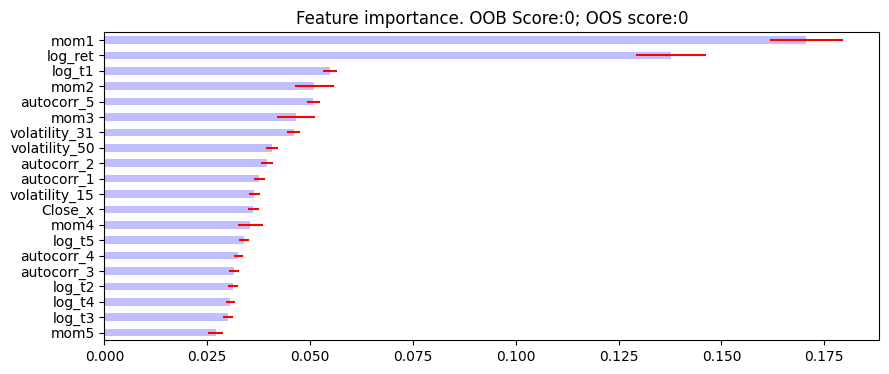

In [ ]:
plot_feature_importance(mdi_feat_imp, 0, 0)

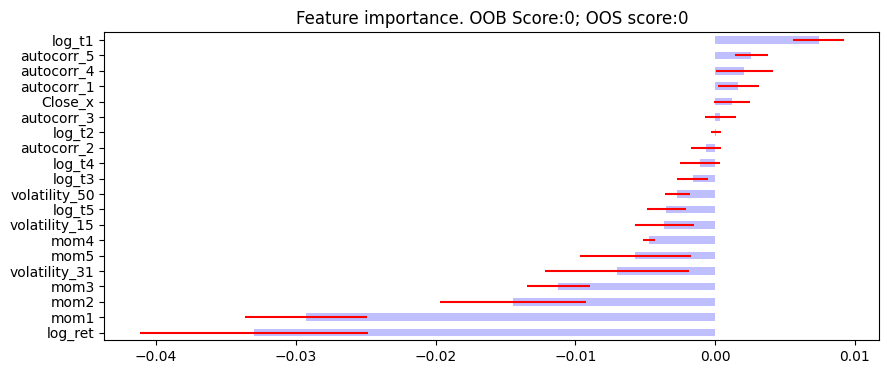

In [ ]:
plot_feature_importance(mda_feat_imp, 0, 0)

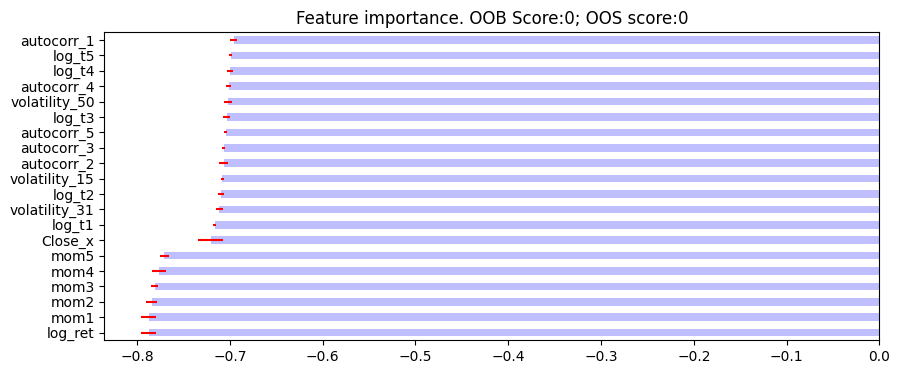

In [ ]:
plot_feature_importance(sfi_feat_imp, 0, 0)

### Para mejor modelo sin sample weights

In [ ]:
# MDI, MDA, SFI feature importance
mdi_feat_imp1 = mean_decrease_impurity(top_model2, X_train.columns)
mda_feat_imp1 = mean_decrease_accuracy(top_model2, X_train, y_train, cv_gen_purged,
                                                         sample_weight_train=return_based_sample_weights.loc[X_train.index].values)
sfi_feat_imp1 = single_feature_importance(top_model2, X_train, y_train, cv_gen_purged,
                                     sample_weight_train=return_based_sample_weights.loc[X_train.index].values)

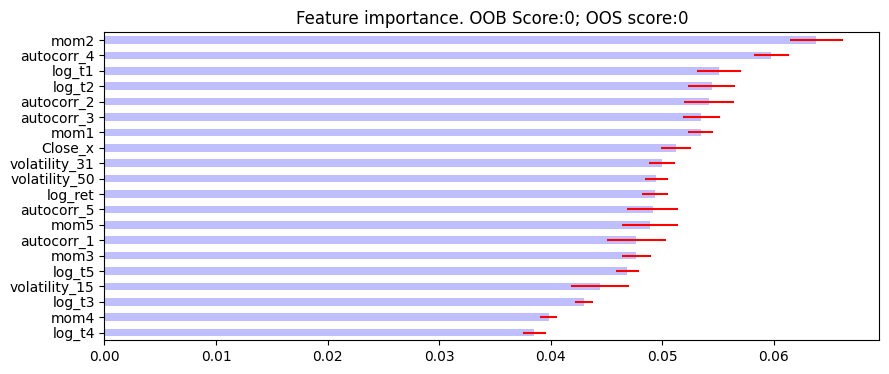

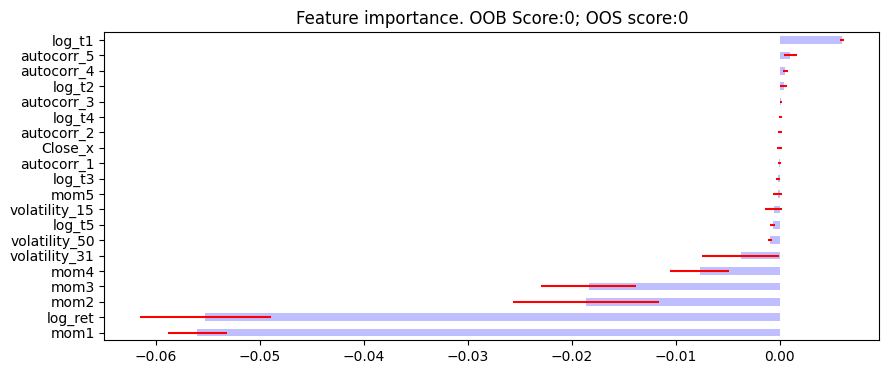

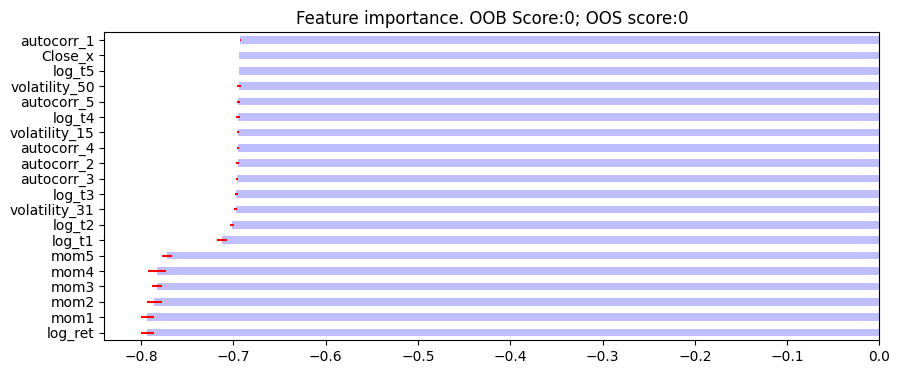

In [ ]:
plot_feature_importance(mdi_feat_imp1, 0, 0)
plot_feature_importance(mda_feat_imp1, 0, 0)
plot_feature_importance(sfi_feat_imp1, 0, 0)

### Para mejor modelo con time decay sample weights

In [ ]:
# MDI, MDA, SFI feature importance
mdi_feat_imp2 = mean_decrease_impurity(top_model3, X_train.columns)
mda_feat_imp2 = mean_decrease_accuracy(top_model3, X_train, y_train, cv_gen_purged,
                                                         sample_weight_train=return_based_sample_weights.loc[X_train.index].values)
sfi_feat_imp2 = single_feature_importance(top_model3, X_train, y_train, cv_gen_purged,
                                     sample_weight_train=return_based_sample_weights.loc[X_train.index].values)

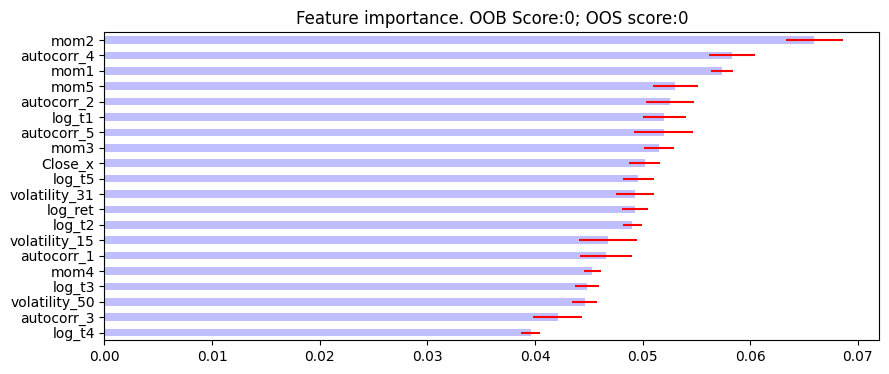

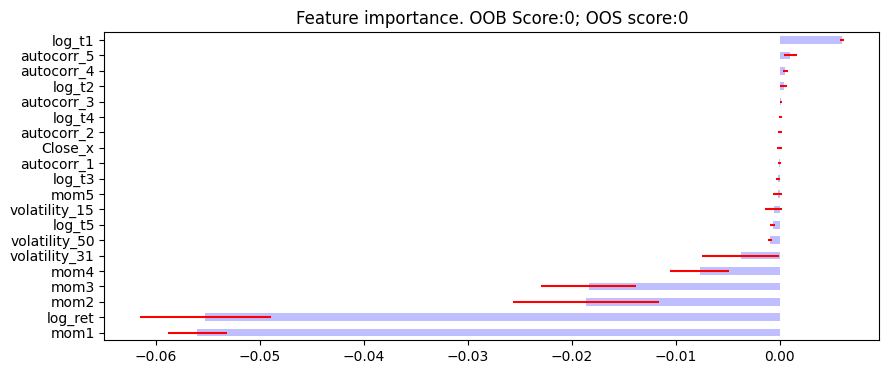

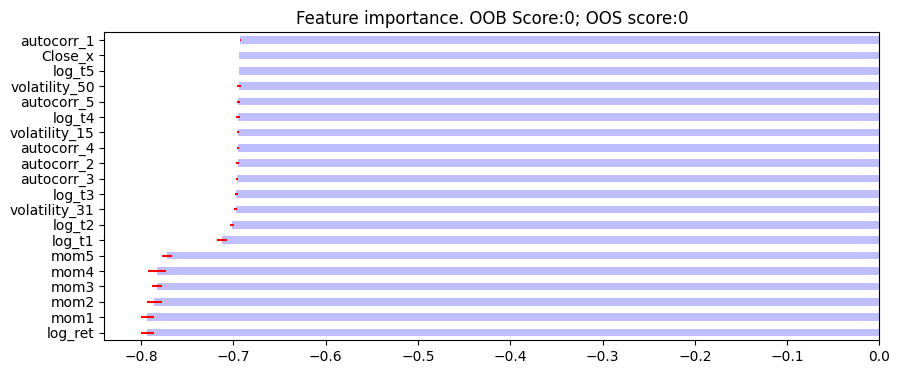

In [ ]:
plot_feature_importance(mdi_feat_imp2, 0, 0)
plot_feature_importance(mda_feat_imp2, 0, 0)
plot_feature_importance(sfi_feat_imp2, 0, 0)

## Metalabelling PoC with Random forest

### Thecnical Indicators

In [ ]:
# Compute RSI
def relative_strength_index(df, n):
        """Calculate Relative Strength Index(RSI) for given data.
        https://github.com/Crypto-toolbox/pandas-technical-indicators/blob/master/technical_indicators.py

        :param df: pandas.DataFrame
        :param n:
        :return: pandas.DataFrame
        """
        i = 0
        UpI = [0]
        DoI = [0]
        while i + 1 <= df.index[-1]:
            UpMove = df.loc[i + 1, 'High'] - df.loc[i, 'High']
            DoMove = df.loc[i, 'Low'] - df.loc[i + 1, 'Low']
            if UpMove > DoMove and UpMove > 0:
                UpD = UpMove
            else:
                UpD = 0
            UpI.append(UpD)
            if DoMove > UpMove and DoMove > 0:
                DoD = DoMove
            else:
                DoD = 0
            DoI.append(DoD)
            i = i + 1
        UpI = pd.Series(UpI)
        DoI = pd.Series(DoI)
        PosDI = pd.Series(UpI.ewm(span=n, min_periods=n).mean())
        NegDI = pd.Series(DoI.ewm(span=n, min_periods=n).mean())
        RSI = pd.Series(round(PosDI * 100. / (PosDI + NegDI)), name='RSI_' + str(n))
        # df = df.join(RSI)
        return RSI

def get_rsi(data, window=14):
    df = data.copy(deep=True).reset_index()
    rsi = relative_strength_index(df, window)
    rsi_df = pd.Series(data=rsi.values, index=data.index)
    return rsi_df

In [ ]:
def bbands(close_prices, window, no_of_stdev):
    rolling_mean = close_prices.ewm(span=window).mean()
    rolling_std = close_prices.ewm(span=window).std()

    upper_band = rolling_mean + (rolling_std * no_of_stdev)
    lower_band = rolling_mean - (rolling_std * no_of_stdev)

    return rolling_mean, upper_band, lower_band

In [ ]:
# compute bands
window = 50
imbalance_bars['avg'], imbalance_bars['upper'], imbalance_bars['lower'] = bbands(imbalance_bars['Close'], window, no_of_stdev=1.5)
imbalance_bars.sample(10)

,StartDateTime,EndDateTime,Open,High,Low,Close,NumTicks,avg,upper,lower
Date,,,,,,,,,,
2022-10-26 03:00:02.000,2022-10-26 03:00:02.000,2022-10-26 04:43:53.000,8735.1,8745.0,8728.9,8745.0,6232,8695.411338,8787.310525,8603.512151
2022-11-21 11:26:51.191,2022-11-21 11:26:51.191,2022-11-21 17:11:04.251,8834.6,8835.8,8824.5,8824.5,20654,8874.239438,8937.115988,8811.362888
2021-03-01 04:14:34.000,2021-03-01 04:14:34.000,2021-03-01 06:25:57.000,9685.0,9689.7,9674.9,9674.9,7884,9676.773094,9720.695731,9632.850457
2022-10-20 09:59:50.000,2022-10-20 09:59:50.000,2022-10-20 12:41:21.000,8604.9,8615.0,8602.7,8615.0,9692,8567.068756,8610.366609,8523.770904
2020-09-18 22:37:07.000,2020-09-18 22:37:07.000,2020-09-19 05:29:32.000,10032.2,10039.4,10022.3,10022.3,24746,10034.691879,10076.956566,9992.427191
2019-11-02 05:39:35.000,2019-11-02 05:39:35.000,2019-11-02 06:34:36.000,10258.0,10267.9,10255.2,10267.9,3302,10297.825118,10352.915420,10242.734815
2023-09-24 21:28:27.140,2023-09-24 21:28:27.140,2023-09-24 21:58:06.149,8420.8,8421.3,8410.7,8410.7,1780,8414.612452,8443.706928,8385.517976
2022-03-05 14:27:46.000,2022-03-05 14:27:46.000,2022-03-05 19:06:49.000,8803.8,8809.8,8793.9,8793.9,16744,8813.342960,8842.877262,8783.808658
2023-12-08 08:46:45.253,2023-12-08 08:46:45.253,2023-12-08 09:38:32.236,8483.3,8483.8,8473.4,8473.4,3108,8494.753176,8522.195848,8467.310503


In [ ]:
# Compute RSI
rsi_df = get_rsi(imbalance_bars, window=14)
imbalance_bars['rsi'] = pd.Series(data=rsi_df.values, index=imbalance_bars.index)

# Drop the NaN values from our imbalance_bars set
imbalance_bars.dropna(axis=0, how='any', inplace=True)

In [ ]:
# Compute sides
imbalance_bars['side'] = np.nan

long_signals = (imbalance_bars['Close'] <= imbalance_bars['lower'])
short_signals = (imbalance_bars['Close'] >= imbalance_bars['upper'])

imbalance_bars.loc[long_signals, 'side'] = 1
imbalance_bars.loc[short_signals, 'side'] = -1

print(imbalance_bars.side.value_counts())

# Remove Look ahead bias by lagging the signal
imbalance_bars['side'] = imbalance_bars['side'].shift(1)

side
 1.0    1040
-1.0     797
Name: count, dtype: int64


In [ ]:
# Save the raw imbalance_bars
raw_data = imbalance_bars.copy()

# Drop the NaN values from our imbalance_bars set
imbalance_bars.dropna(axis=0, how='any', inplace=True)
print(imbalance_bars.side.value_counts())

side
 1.0    1039
-1.0     797
Name: count, dtype: int64


In [ ]:

# Compute daily volatility
daily_vol = mlf.util.get_daily_vol(close=imbalance_bars['Close'], lookback=50)

cusum_threshold = daily_vol.mean()
# Apply Symmetric CUSUM Filter and get timestamps for events
# Note: Only the CUSUM filter needs a point estimate for volatility
cusum_events = filters.cusum_filter(imbalance_bars['Close'], threshold=cusum_threshold)

# Compute vertical barrier
vertical_barriers = labeling.add_vertical_barrier(t_events=cusum_events, close=imbalance_bars['Close'], num_days=1)

In [ ]:
pt_sl = [0, 2]
min_ret = 0.0001
triple_barrier_events = labeling.get_events(close=imbalance_bars['Close'],
                                            t_events=cusum_events,
                                            pt_sl=pt_sl,
                                            target=daily_vol,
                                            min_ret=min_ret,
                                            num_threads=2,
                                            vertical_barrier_times=vertical_barriers,
                                            side_prediction=imbalance_bars['side'])

2024-12-16 13:11:38.905565 100.0% apply_pt_sl_on_t1 done after 0.12 minutes. Remaining 0.0 minutes.


In [ ]:
# Averge uniqueness
avg_uniqueness = concurrent.get_av_uniqueness_from_triple_barrier(triple_barrier_events, imbalance_bars, num_threads=1)
print(avg_uniqueness.mean())

tW    0.904535
dtype: float64


In [ ]:
labels = labeling.get_bins(triple_barrier_events, imbalance_bars['Close'])
labels.side.value_counts()

side
 1.0    159
-1.0    123
Name: count, dtype: int64

In [ ]:
primary_forecast = pd.DataFrame(labels['bin'])
primary_forecast['pred'] = 1
primary_forecast.columns = ['actual', 'pred']

# Performance Metrics
actual = primary_forecast['actual']
pred = primary_forecast['pred']
print(classification_report(y_true=actual, y_pred=pred))

print("Confusion Matrix")
print(confusion_matrix(actual, pred))

print('')
print("Accuracy")
print(accuracy_score(actual, pred))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       174
           1       0.38      1.00      0.55       108

    accuracy                           0.38       282
   macro avg       0.19      0.50      0.28       282
weighted avg       0.15      0.38      0.21       282

Confusion Matrix
[[  0 174]
 [  0 108]]

Accuracy
0.3829787234042553


C:\Users\angel\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\angel\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\angel\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



### Features

In [ ]:
# Log Returns
raw_data['log_ret'] = np.log(raw_data['Close']).diff()

# Momentum
raw_data['mom1'] = raw_data['Close'].pct_change(periods=1)
raw_data['mom2'] = raw_data['Close'].pct_change(periods=2)
raw_data['mom3'] = raw_data['Close'].pct_change(periods=3)
raw_data['mom4'] = raw_data['Close'].pct_change(periods=4)
raw_data['mom5'] = raw_data['Close'].pct_change(periods=5)

# Volatility
window_stdev = 50
raw_data['volatility'] = raw_data['log_ret'].rolling(window=window_stdev, min_periods=window_stdev, center=False).std()

# Serial Correlation (Takes about 4 minutes)
window_autocorr = 50

raw_data['autocorr_1'] = raw_data['log_ret'].rolling(window=window_autocorr, min_periods=window_autocorr, center=False).apply(lambda x: x.autocorr(lag=1), raw=False)
raw_data['autocorr_2'] = raw_data['log_ret'].rolling(window=window_autocorr, min_periods=window_autocorr, center=False).apply(lambda x: x.autocorr(lag=2), raw=False)
raw_data['autocorr_3'] = raw_data['log_ret'].rolling(window=window_autocorr, min_periods=window_autocorr, center=False).apply(lambda x: x.autocorr(lag=3), raw=False)
raw_data['autocorr_4'] = raw_data['log_ret'].rolling(window=window_autocorr, min_periods=window_autocorr, center=False).apply(lambda x: x.autocorr(lag=4), raw=False)
raw_data['autocorr_5'] = raw_data['log_ret'].rolling(window=window_autocorr, min_periods=window_autocorr, center=False).apply(lambda x: x.autocorr(lag=5), raw=False)

# Get the various log -t returns
raw_data['log_t1'] = raw_data['log_ret'].shift(1)
raw_data['log_t2'] = raw_data['log_ret'].shift(2)
raw_data['log_t3'] = raw_data['log_ret'].shift(3)
raw_data['log_t4'] = raw_data['log_ret'].shift(4)
raw_data['log_t5'] = raw_data['log_ret'].shift(5)

# Add fast and slow moving averages
fast_window = 7
slow_window = 15

raw_data['fast_mavg'] = raw_data['Close'].rolling(window=fast_window, min_periods=fast_window, center=False).mean()
raw_data['slow_mavg'] = raw_data['Close'].rolling(window=slow_window, min_periods=slow_window, center=False).mean()

raw_data

,StartDateTime,EndDateTime,Open,High,Low,Close,NumTicks,avg,upper,lower,...,autocorr_3,autocorr_4,autocorr_5,log_t1,log_t2,log_t3,log_t4,log_t5,fast_mavg,slow_mavg
Date,,,,,,,,,,,,,,,,,,,,,
2019-05-29 22:34:28.000,2019-05-29 22:34:28.000,2019-05-30 00:10:49.000,10010.2,10020.1,10008.9,10020.1,5782,10037.098353,10064.704017,10009.492689,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2019-05-30 00:10:50.000,2019-05-30 00:10:50.000,2019-05-30 02:08:47.000,10020.2,10026.2,10010.1,10010.1,7078,10034.751981,10063.598503,10005.905459,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2019-05-30 02:08:48.000,2019-05-30 02:08:48.000,2019-05-30 04:55:09.000,10010.0,10020.1,10007.6,10020.1,9982,10033.536572,10061.804690,10005.268455,...,NaN,NaN,NaN,-0.000998,NaN,NaN,NaN,NaN,NaN,NaN
2019-05-30 04:55:10.000,2019-05-30 04:55:10.000,2019-05-30 08:10:19.000,10020.2,10026.4,10010.1,10010.1,11710,10031.673931,10060.467962,10002.879900,...,NaN,NaN,NaN,0.000998,-0.000998,NaN,NaN,NaN,NaN,NaN
2019-05-30 08:10:20.000,2019-05-30 08:10:20.000,2019-05-30 09:03:17.000,10010.2,10020.1,10009.4,10020.1,3178,10030.789683,10058.821425,10002.757940,...,NaN,NaN,NaN,-0.000998,0.000998,-0.000998,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-12-08 06:04:40.130,2024-12-08 06:04:40.130,2024-12-08 08:01:43.132,8193.7,8201.6,8183.6,8183.6,7024,8210.214345,8242.169713,8178.258976,...,-0.243296,-0.225224,-0.167659,-0.001220,0.001220,0.001221,0.001223,-0.001223,8187.885714,8201.600000
2024-12-08 08:01:44.136,2024-12-08 08:01:44.136,2024-12-08 10:37:49.116,8183.7,8189.9,8173.6,8173.6,9366,8208.778488,8241.900541,8175.656435,...,-0.282421,-0.226865,-0.169549,-0.001221,-0.001220,0.001220,0.001221,0.001223,8186.457143,8198.266667
2024-12-08 10:37:50.122,2024-12-08 10:37:50.122,2024-12-08 12:22:33.125,8173.5,8180.1,8163.6,8163.6,6284,8207.006783,8242.086882,8171.926683,...,-0.243180,-0.225563,-0.168120,-0.001223,-0.001221,-0.001220,0.001220,0.001221,8185.028571,8193.600000


In [ ]:
# Add Trending signals
raw_data['sma'] = np.nan

long_signals = raw_data['fast_mavg'] >= raw_data['slow_mavg']
short_signals = raw_data['fast_mavg'] < raw_data['slow_mavg']
raw_data.loc[long_signals, 'sma'] = 1
raw_data.loc[short_signals, 'sma'] = -1

In [ ]:
# Re compute sides
raw_data['side'] = np.nan

long_signals = raw_data['Close'] <= raw_data['lower']
short_signals = raw_data['Close'] >= raw_data['upper']

raw_data.loc[long_signals, 'side'] = 1
raw_data.loc[short_signals, 'side'] = -1

In [ ]:
# Remove look ahead bias
raw_data = raw_data.shift(1)
raw_data.head()

,StartDateTime,EndDateTime,Open,High,Low,Close,NumTicks,avg,upper,lower,...,autocorr_4,autocorr_5,log_t1,log_t2,log_t3,log_t4,log_t5,fast_mavg,slow_mavg,sma
Date,,,,,,,,,,,,,,,,,,,,,
2019-05-29 22:34:28,NaT,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2019-05-30 00:10:50,2019-05-29 22:34:28,2019-05-30 00:10:49,10010.2,10020.1,10008.9,10020.1,5782.0,10037.098353,10064.704017,10009.492689,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2019-05-30 02:08:48,2019-05-30 00:10:50,2019-05-30 02:08:47,10020.2,10026.2,10010.1,10010.1,7078.0,10034.751981,10063.598503,10005.905459,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2019-05-30 04:55:10,2019-05-30 02:08:48,2019-05-30 04:55:09,10010.0,10020.1,10007.6,10020.1,9982.0,10033.536572,10061.804690,10005.268455,...,NaN,NaN,-0.000998,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2019-05-30 08:10:20,2019-05-30 04:55:10,2019-05-30 08:10:19,10020.2,10026.4,10010.1,10010.1,11710.0,10031.673931,10060.467962,10002.879900,...,NaN,NaN,0.000998,-0.000998,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# @title Normalización
# Crear el scaler
min_max_scaler = MinMaxScaler()

# Aplicar la normalización a las columnas numéricas
scaling_columns = ['NumTicks']
raw_data[scaling_columns] = min_max_scaler.fit_transform(raw_data[scaling_columns])
raw_data

,StartDateTime,EndDateTime,Open,High,Low,Close,NumTicks,avg,upper,lower,...,autocorr_4,autocorr_5,log_t1,log_t2,log_t3,log_t4,log_t5,fast_mavg,slow_mavg,sma
Date,,,,,,,,,,,,,,,,,,,,,
2019-05-29 22:34:28.000,NaT,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2019-05-30 00:10:50.000,2019-05-29 22:34:28.000,2019-05-30 00:10:49.000,10010.2,10020.1,10008.9,10020.1,0.050441,10037.098353,10064.704017,10009.492689,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2019-05-30 02:08:48.000,2019-05-30 00:10:50.000,2019-05-30 02:08:47.000,10020.2,10026.2,10010.1,10010.1,0.063105,10034.751981,10063.598503,10005.905459,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2019-05-30 04:55:10.000,2019-05-30 02:08:48.000,2019-05-30 04:55:09.000,10010.0,10020.1,10007.6,10020.1,0.091481,10033.536572,10061.804690,10005.268455,...,NaN,NaN,-0.000998,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2019-05-30 08:10:20.000,2019-05-30 04:55:10.000,2019-05-30 08:10:19.000,10020.2,10026.4,10010.1,10010.1,0.108366,10031.673931,10060.467962,10002.879900,...,NaN,NaN,0.000998,-0.000998,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-12-08 06:04:40.130,2024-12-08 03:33:20.132,2024-12-08 06:04:39.116,8203.7,8207.9,8193.6,8193.6,0.082667,8211.300644,8242.824255,8179.777034,...,-0.184460,-0.205424,0.001220,0.001221,0.001223,-0.001223,-0.001221,8189.314286,8203.600000,-1.0
2024-12-08 08:01:44.136,2024-12-08 06:04:40.130,2024-12-08 08:01:43.132,8193.7,8201.6,8183.6,8183.6,0.062577,8210.214345,8242.169713,8178.258976,...,-0.225224,-0.167659,-0.001220,0.001220,0.001221,0.001223,-0.001223,8187.885714,8201.600000,-1.0
2024-12-08 10:37:50.122,2024-12-08 08:01:44.136,2024-12-08 10:37:49.116,8183.7,8189.9,8173.6,8173.6,0.085462,8208.778488,8241.900541,8175.656435,...,-0.226865,-0.169549,-0.001221,-0.001220,0.001220,0.001221,0.001223,8186.457143,8198.266667,-1.0


### Now Get the data at the specefied events

In [ ]:
# Get features at event dates
X = raw_data.loc[labels.index, :]

# Drop unwanted columns
X.drop(['avg', 'upper', 'lower', 'Open', 'High', 'Low', 'Close',	'StartDateTime',	'EndDateTime', 'fast_mavg',	'slow_mavg'], axis=1, inplace=True)

y = labels['bin']

### Data split

In [ ]:
# Split data into training, validation and test sets
X_training_test = X
y_training_test = y
X_train, X_test, y_train, y_test = train_test_split(X_training_test, y_training_test, test_size=0.2, shuffle=False)

In [ ]:
train_df = pd.concat([y_train, X_train], axis=1, join='inner')
train_df['bin'].value_counts()

bin
0    138
1     87
Name: count, dtype: int64

In [ ]:
# Upsample the training data to have a 50 - 50 split
# https://elitedatascience.com/imbalanced-classes
majority = train_df[train_df['bin'] == 0]
minority = train_df[train_df['bin'] == 1]

new_minority = resample(minority,
                   replace=True,     # sample with replacement
                   n_samples=majority.shape[0],    # to match majority class
                   random_state=42)

train_df = pd.concat([majority, new_minority])
train_df = shuffle(train_df, random_state=42)

train_df['bin'].value_counts()

bin
0    138
1    138
Name: count, dtype: int64

In [ ]:
# Create training data
y_train = train_df['bin']
X_train= train_df.loc[:, train_df.columns != 'bin']

In [ ]:
X_train

,NumTicks,rsi,side,log_ret,mom1,mom2,mom3,mom4,mom5,volatility,...,autocorr_2,autocorr_3,autocorr_4,autocorr_5,log_t1,log_t2,log_t3,log_t4,log_t5,sma
2019-06-07 06:08:38.000,0.149099,21.0,NaN,-0.004983,-0.004970,-0.005958,-0.003980,0.001000,NaN,NaN,...,NaN,NaN,NaN,NaN,-0.000994,0.001988,0.004987,NaN,NaN,NaN
2019-06-11 09:53:53.000,0.041851,23.0,NaN,0.001004,0.001004,0.000000,0.001004,0.000000,-0.001002,NaN,...,NaN,NaN,NaN,NaN,-0.001004,0.001004,-0.001004,-0.001002,-0.001001,NaN
2019-06-13 11:17:33.000,0.151996,93.0,NaN,-0.000987,-0.000986,0.000000,0.005958,0.016048,0.017068,NaN,...,NaN,NaN,NaN,NaN,0.000987,0.005941,0.009980,0.001004,-0.001004,1.0
2019-07-08 14:51:30.000,0.168241,81.0,NaN,-0.000983,-0.000982,0.002959,0.001970,0.003949,0.002959,NaN,...,NaN,NaN,NaN,NaN,0.003937,-0.000986,0.001972,-0.000987,0.000987,1.0
2019-07-17 13:38:45.000,0.238764,19.0,NaN,-0.000992,-0.000991,-0.000991,-0.000129,-0.003096,-0.002109,NaN,...,NaN,NaN,NaN,NaN,0.000000,0.000863,-0.002972,0.000990,-0.006828,-1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-11-22 22:39:48.208,0.071638,20.0,NaN,-0.003522,-0.003515,-0.004682,-0.004682,-0.003515,-0.007968,0.002660,...,0.051927,0.031543,0.219138,-0.071466,-0.001171,0.000000,0.001171,-0.004478,0.001167,-1.0
2023-12-04 21:35:01.232,0.129845,10.0,NaN,0.001185,0.001186,-0.007067,-0.010558,-0.011716,-0.011716,0.002903,...,0.077559,0.012526,0.175090,0.115569,-0.008278,-0.003522,-0.001171,0.000000,0.001171,-1.0
2023-12-08 12:56:47.206,0.143080,71.0,NaN,-0.001173,-0.001172,-0.002341,-0.001172,0.002352,0.009439,0.002438,...,-0.048937,-0.249707,-0.058626,0.158330,-0.001171,0.001171,0.003522,0.007045,0.001185,-1.0
2023-12-10 22:18:44.135,0.387640,30.0,NaN,0.001182,0.001183,0.002369,0.001183,-0.007039,-0.008203,0.002678,...,-0.064378,-0.239211,-0.190552,-0.075357,0.001184,-0.001184,-0.008247,-0.001173,-0.001171,-1.0


In [ ]:
parameters = {'max_depth':[2, 3, 4, 5, 7],
              'n_estimators':[1, 10, 25, 50, 100, 256, 512],
              'random_state':[42]}

def perform_grid_search(X_data, y_data):
    rf = RandomForestClassifier(criterion='entropy')

    clf = GridSearchCV(rf, parameters, cv=4, scoring='roc_auc', n_jobs=3)

    clf.fit(X_data, y_data)

    print(clf.cv_results_['mean_test_score'])

    return clf.best_params_['n_estimators'], clf.best_params_['max_depth']

In [ ]:
# extract parameters
n_estimator, depth = perform_grid_search(X_train, y_train)
c_random_state = 42
print(n_estimator, depth, c_random_state)

[0.49569328 0.60021008 0.64243697 0.65840336 0.66029412 0.67352941
 0.68277311 0.55483193 0.61260504 0.68655462 0.6802521  0.69516807
 0.70945378 0.71218487 0.59789916 0.69180672 0.73088235 0.72794118
 0.73340336 0.7407563  0.73823529 0.60168067 0.67394958 0.71701681
 0.7262605  0.75336134 0.76617647 0.77037815 0.60409664 0.76817227
 0.77521008 0.7782563  0.80588235 0.80252101 0.80546218]
100 7 42


In [ ]:
# Random Forest Model
rf = RandomForestClassifier(max_depth=depth, n_estimators=n_estimator, oob_score=True,
                            criterion='entropy', random_state=c_random_state)
rf.fit(X_train, y_train.values.ravel())
print("Out-of-bag Accuracy (OOB Score): {:.6f}".format(rf.oob_score_))

Out-of-bag Accuracy (OOB Score): 0.757246


              precision    recall  f1-score   support

           0       1.00      0.99      0.99       138
           1       0.99      1.00      0.99       138

    accuracy                           0.99       276
   macro avg       0.99      0.99      0.99       276
weighted avg       0.99      0.99      0.99       276

Confusion Matrix
[[136   2]
 [  0 138]]

Accuracy
0.9927536231884058


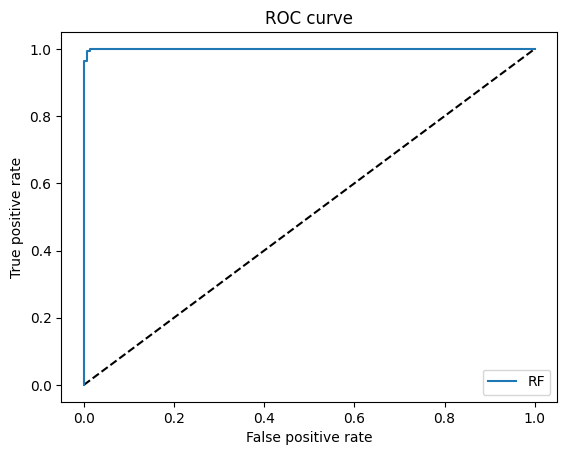

In [ ]:
# Performance Metrics
y_pred_rf = rf.predict_proba(X_train)[:, 1]
y_pred = rf.predict(X_train)
fpr_rf, tpr_rf, _ = roc_curve(y_train, y_pred_rf)
print(classification_report(y_train, y_pred))

print("Confusion Matrix")
print(confusion_matrix(y_train, y_pred))

print('')
print("Accuracy")
print(accuracy_score(y_train, y_pred))

plt.figure(1)
plt.plot([0, 1], [0, 1], 'k--')
plt.plot(fpr_rf, tpr_rf, label='RF')
plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.title('ROC curve')
plt.legend(loc='best')
plt.show()

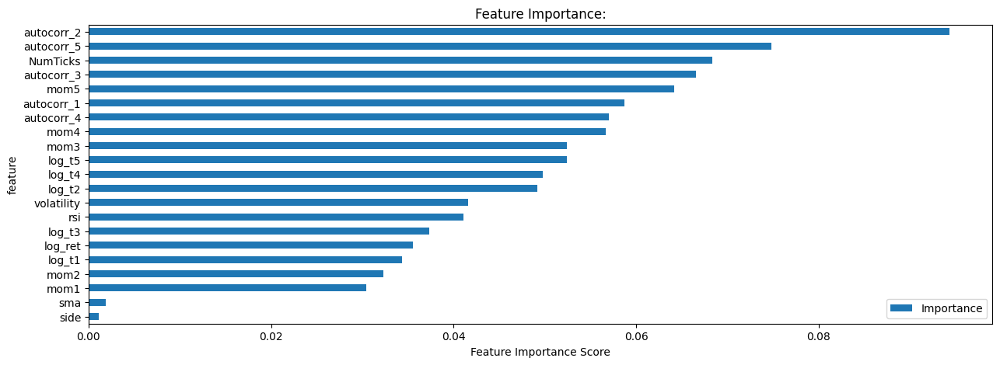

In [ ]:
# Feature Importance
title = 'Feature Importance:'
figsize = (15, 5)

feat_imp = pd.DataFrame({'Importance':rf.feature_importances_})
feat_imp['feature'] = X.columns
feat_imp.sort_values(by='Importance', ascending=False, inplace=True)
feat_imp = feat_imp

feat_imp.sort_values(by='Importance', inplace=True)
feat_imp = feat_imp.set_index('feature', drop=True)
feat_imp.plot.barh(title=title, figsize=figsize)
plt.xlabel('Feature Importance Score')
plt.show()

## Bibliografía